In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt
from altair import expr, datum
import seaborn as sns

In [ ]:
#Please change depending on where you store your data.
X_train_df = pd.read_csv('/content/drive/MyDrive/Master2/Ensemble learning/Project/Data/X_train.csv')
Y_train_df = pd.read_csv('/content/drive/MyDrive/Master2/Ensemble learning/Project/Data/y_train.csv')
X_test_df = pd.read_csv('/content/drive/MyDrive/Master2/Ensemble learning/Project/Data/X_test.csv')

## Exploratory Data Analysis

In [4]:
X_train_df.head()

,ID,DAY_ID,COUNTRY,DE_CONSUMPTION,FR_CONSUMPTION,DE_FR_EXCHANGE,FR_DE_EXCHANGE,DE_NET_EXPORT,FR_NET_EXPORT,DE_NET_IMPORT,...,FR_RESIDUAL_LOAD,DE_RAIN,FR_RAIN,DE_WIND,FR_WIND,DE_TEMP,FR_TEMP,GAS_RET,COAL_RET,CARBON_RET
0,1054,206,FR,0.210099,-0.427458,-0.606523,0.606523,NaN,0.692860,NaN,...,-0.444661,-0.172680,-0.556356,-0.790823,-0.283160,-1.069070,-0.063404,0.339041,0.124552,-0.002445
1,2049,501,FR,-0.022399,-1.003452,-0.022063,0.022063,-0.573520,-1.130838,0.573520,...,-1.183194,-1.240300,-0.770457,1.522331,0.828412,0.437419,1.831241,-0.659091,0.047114,-0.490365
2,1924,687,FR,1.395035,1.978665,1.021305,-1.021305,-0.622021,-1.682587,0.622021,...,1.947273,-0.480700,-0.313338,0.431134,0.487608,0.684884,0.114836,0.535974,0.743338,0.204952
3,297,720,DE,-0.983324,-0.849198,-0.839586,0.839586,-0.270870,0.563230,0.270870,...,-0.976974,-1.114838,-0.507570,-0.499409,-0.236249,0.350938,-0.417514,0.911652,-0.296168,1.073948
4,1101,818,FR,0.143807,-0.617038,-0.924990,0.924990,NaN,0.990324,NaN,...,-0.526267,-0.541465,-0.424550,-1.088158,-1.011560,0.614338,0.729495,0.245109,1.526606,2.614378


In [5]:
Y_train_df.head()

,ID,TARGET
0,1054,0.028313
1,2049,-0.112516
2,1924,-0.180840
3,297,-0.260356
4,1101,-0.071733


In [7]:
# Basic info
print(X_train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1494 entries, 0 to 1493
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                1494 non-null   int64  
 1   DAY_ID            1494 non-null   int64  
 2   COUNTRY           1494 non-null   object 
 3   DE_CONSUMPTION    1494 non-null   float64
 4   FR_CONSUMPTION    1494 non-null   float64
 5   DE_FR_EXCHANGE    1469 non-null   float64
 6   FR_DE_EXCHANGE    1469 non-null   float64
 7   DE_NET_EXPORT     1370 non-null   float64
 8   FR_NET_EXPORT     1424 non-null   float64
 9   DE_NET_IMPORT     1370 non-null   float64
 10  FR_NET_IMPORT     1424 non-null   float64
 11  DE_GAS            1494 non-null   float64
 12  FR_GAS            1494 non-null   float64
 13  DE_COAL           1494 non-null   float64
 14  FR_COAL           1494 non-null   float64
 15  DE_HYDRO          1494 non-null   float64
 16  FR_HYDRO          1494 non-null   float64


In [8]:
# Summary statistics
print(X_train_df.describe())

                ID       DAY_ID  DE_CONSUMPTION  FR_CONSUMPTION  \
count  1494.000000  1494.000000     1494.000000     1494.000000   
mean   1072.759036   591.861446        0.427442       -0.020032   
std     618.013179   345.065043        0.673412        0.918995   
min       0.000000     0.000000       -2.265563       -1.462350   
25%     540.250000   292.250000       -0.037421       -0.716771   
50%    1077.500000   591.000000        0.357061       -0.394166   
75%    1597.500000   885.750000        0.922057        0.650533   
max    2146.000000  1215.000000        2.033851        3.300640   

       DE_FR_EXCHANGE  FR_DE_EXCHANGE  DE_NET_EXPORT  FR_NET_EXPORT  \
count     1469.000000     1469.000000    1370.000000    1424.000000   
mean        -0.145508        0.145508      -0.256332      -0.072643   
std          0.970226        0.970226       0.957443       1.075830   
min         -2.856874       -2.634831      -2.464849      -2.825331   
25%         -0.875213       -0.638867    

In [9]:
# Check for missing values
print(X_train_df.isnull().sum())

ID                    0
DAY_ID                0
COUNTRY               0
DE_CONSUMPTION        0
FR_CONSUMPTION        0
DE_FR_EXCHANGE       25
FR_DE_EXCHANGE       25
DE_NET_EXPORT       124
FR_NET_EXPORT        70
DE_NET_IMPORT       124
FR_NET_IMPORT        70
DE_GAS                0
FR_GAS                0
DE_COAL               0
FR_COAL               0
DE_HYDRO              0
FR_HYDRO              0
DE_NUCLEAR            0
FR_NUCLEAR            0
DE_SOLAR              0
FR_SOLAR              0
DE_WINDPOW            0
FR_WINDPOW            0
DE_LIGNITE            0
DE_RESIDUAL_LOAD      0
FR_RESIDUAL_LOAD      0
DE_RAIN              94
FR_RAIN              94
DE_WIND              94
FR_WIND              94
DE_TEMP              94
FR_TEMP              94
GAS_RET               0
COAL_RET              0
CARBON_RET            0
dtype: int64


In [10]:
# Summary statistics
print(Y_train_df.describe())

                ID       TARGET
count  1494.000000  1494.000000
mean   1072.759036     0.089934
std     618.013179     1.034582
min       0.000000    -6.519268
25%     540.250000    -0.219861
50%    1077.500000     0.000000
75%    1597.500000     0.269719
max    2146.000000     7.786578


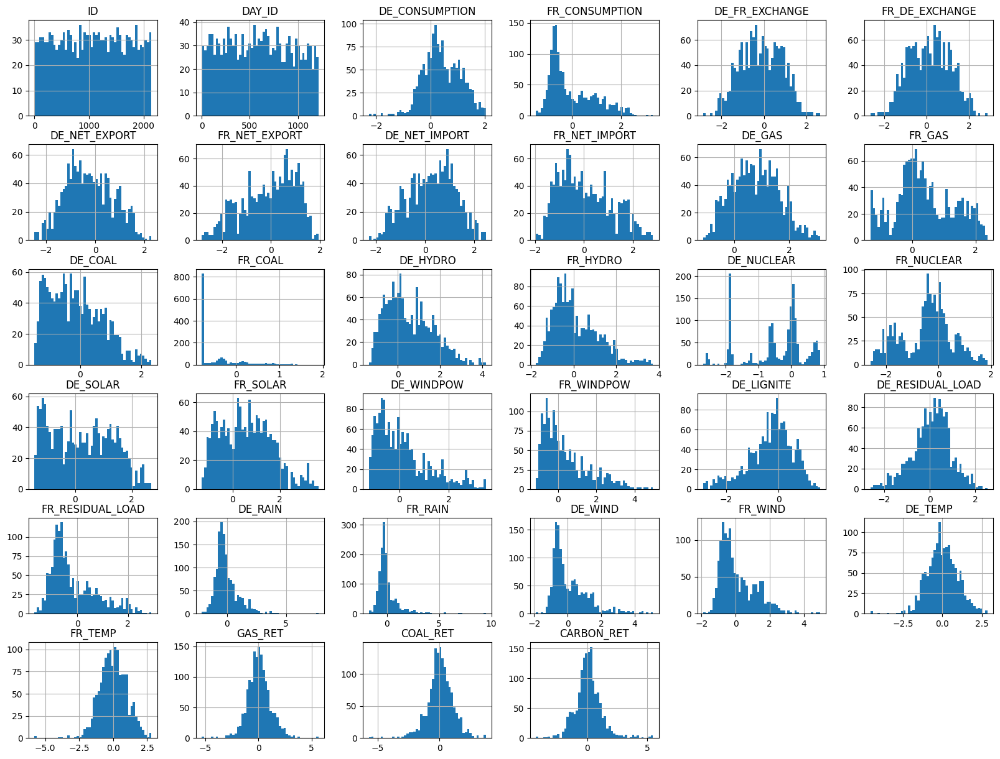

In [11]:
# Visualize the distribution of features
X_train_df.hist(bins=50, figsize=(20,15))
plt.show()

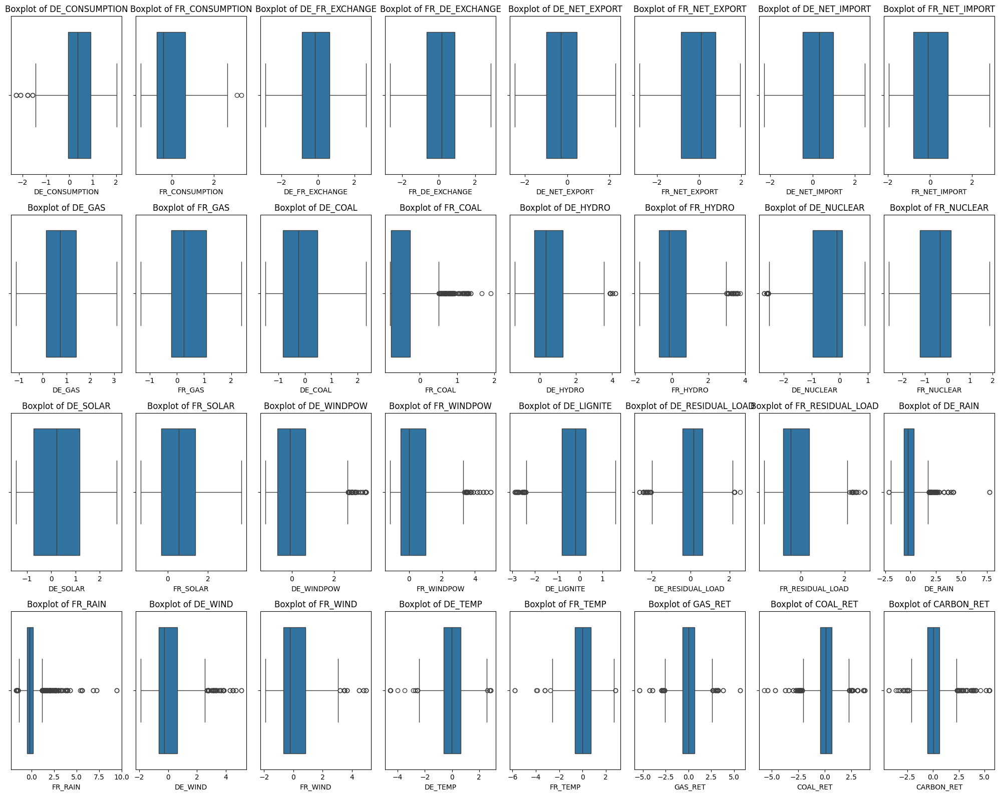

In [32]:
import math

# Boxplot for each numerical feature to check for outliers
numerical_columns = X_train_df.select_dtypes(include=['float64']).columns
num_plots = len(numerical_columns)
num_rows = math.ceil(num_plots / 8)

fig, axes = plt.subplots(num_rows, 8, figsize=(20, num_rows*4))
axes = axes.flatten()

for i, column in enumerate(numerical_columns):
    sns.boxplot(x=X_train_df[column], ax=axes[i])
    axes[i].set_title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

###Distribution of Y by country

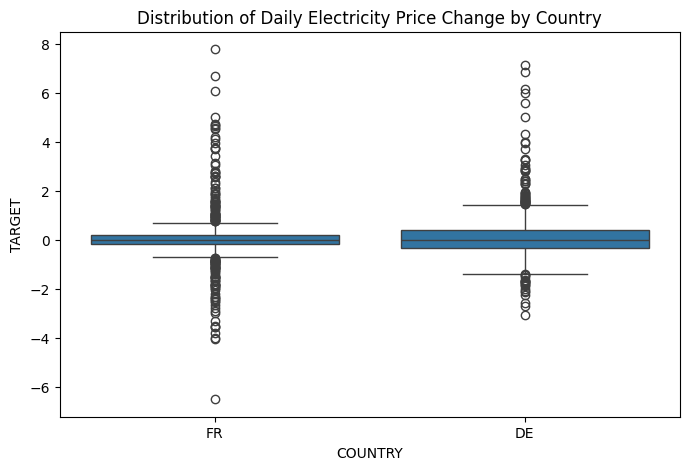

In [15]:
# Bivariate analysis - country-wise analysis
plt.figure(figsize=(8, 5))
sns.boxplot(x='COUNTRY', y='TARGET', data=pd.concat([X_train_df['COUNTRY'], Y_train_df], axis=1))
plt.title('Distribution of Daily Electricity Price Change by Country')
plt.show()

In [16]:
# Identify common features
common_features = [col for col in X_train_df.columns if not col.startswith('DE_') and not col.startswith('FR_')]

# Identify DE and FR specific features
de_specific_features = [col for col in X_train_df.columns if col.startswith('DE_')]
fr_specific_features = [col for col in X_train_df.columns if col.startswith('FR_')]

# Filter the X_train dataset for Germany
de_features = common_features + de_specific_features
X_train_de = X_train_df[X_train_df['COUNTRY'] == 'DE'][de_features]

# Filter the X_train dataset for France
fr_features = common_features + fr_specific_features
X_train_fr = X_train_df[X_train_df['COUNTRY'] == 'FR'][fr_features]

# Now we have X_train_de and X_train_fr with only the common features and their respective country-specific features

In [18]:
# Merge the datasets with the target variable using a common identifier, e.g., 'ID'
X_train_de = X_train_de.merge(Y_train_df, on='ID')
X_train_fr = X_train_fr.merge(Y_train_df, on='ID')

In [23]:
#X_train_de.describe()

In [25]:
#X_train_fr.describe()

###Distribution of X by country

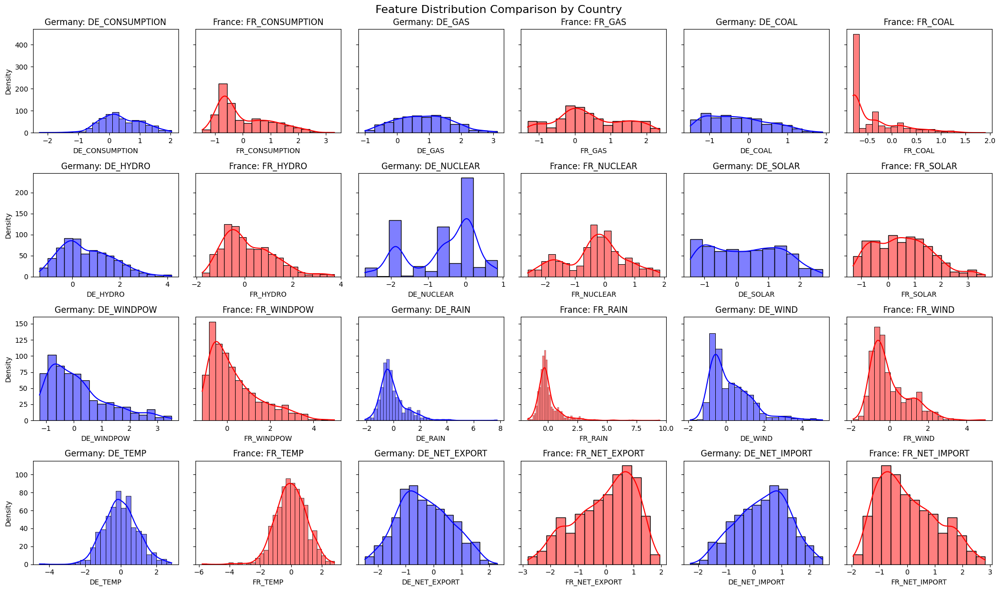

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Merge the datasets with the target variable using a common identifier, e.g., 'ID'
X_train_de = X_train_de.merge(Y_train_df, on='ID')
X_train_fr = X_train_fr.merge(Y_train_df, on='ID')

# Select a list of features to compare. Here we'll just use the energy-specific features for illustration
features_to_compare = ['CONSUMPTION', 'GAS', 'COAL', 'HYDRO', 'NUCLEAR', 'SOLAR', 'WINDPOW', 'RAIN', 'WIND', 'TEMP', 'NET_EXPORT', 'NET_IMPORT']

features_per_row = 3
num_rows = (len(features_to_compare) + features_per_row - 1) // features_per_row  # This ensures that we have enough rows for all features

fig, axs = plt.subplots(num_rows, features_per_row * 2, figsize=(20, num_rows * 3), sharey='row')  # Adjusted height for each row

for i, feature in enumerate(features_to_compare):
    de_feature = f'DE_{feature}'  # Example: 'DE_CONSUMPTION'
    fr_feature = f'FR_{feature}'  # Example: 'FR_CONSUMPTION'

    row_idx = i // features_per_row
    col_idx_de = (i % features_per_row) * 2
    col_idx_fr = col_idx_de + 1

    # Distribution for Germany
    sns.histplot(X_train_de[de_feature], color="blue", kde=True, ax=axs[row_idx, col_idx_de])
    axs[row_idx, col_idx_de].set_title(f'Germany: {de_feature}')
    axs[row_idx, col_idx_de].set_xlabel(de_feature)
    axs[row_idx, col_idx_de].set_ylabel('Density')

    # Distribution for France
    sns.histplot(X_train_fr[fr_feature], color="red", kde=True, ax=axs[row_idx, col_idx_fr])
    axs[row_idx, col_idx_fr].set_title(f'France: {fr_feature}')
    axs[row_idx, col_idx_fr].set_xlabel(fr_feature)

fig.suptitle('Feature Distribution Comparison by Country', fontsize=16)

plt.tight_layout()
plt.show()

##Correlation Analysis

Additionally, we can compare the correlation of these features with the target variable for each country.


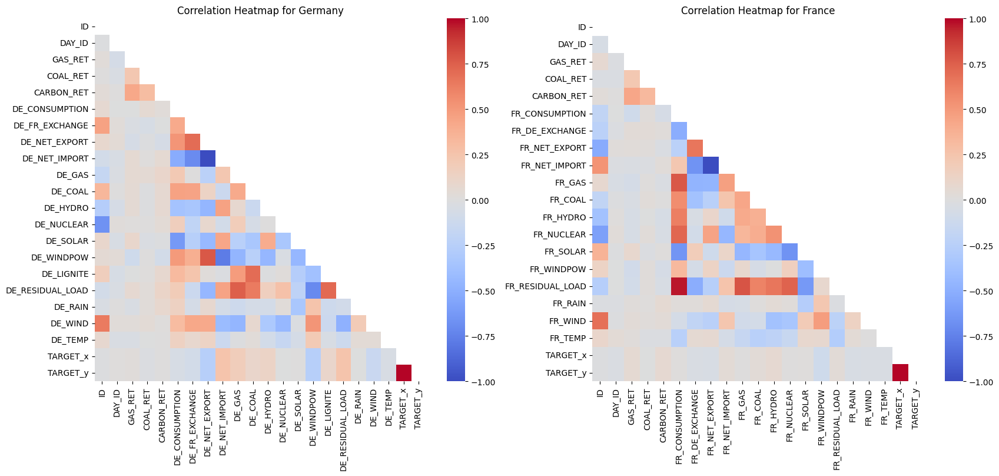

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# For Germany
corr_de = X_train_de.corr(numeric_only=True)
mask_de = np.triu(np.ones_like(corr_de, dtype=bool))
sns.heatmap(corr_de, annot=False, cmap='coolwarm', mask=mask_de, ax=axes[0])
axes[0].set_title('Correlation Heatmap for Germany')

# For France
corr_fr = X_train_fr.corr(numeric_only=True)
mask_fr = np.triu(np.ones_like(corr_fr, dtype=bool))
sns.heatmap(corr_fr, annot=False, cmap='coolwarm', mask=mask_fr, ax=axes[1])
axes[1].set_title('Correlation Heatmap for France')

plt.show()

#Data pre-processing

In [ ]:
XY_df = X_train_df.copy()
XY_df = XY_df.merge(Y_train_df['TARGET'],left_index=True, right_index=True)

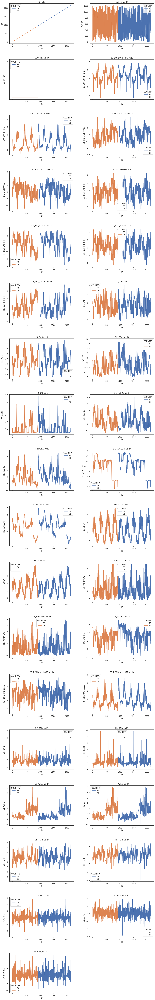

In [ ]:
plt.figure(figsize=(15, 100))

features = XY_df.columns.tolist()

for index, column in enumerate(features[:-1]):
    plt.subplot(20, 2, index + 1)
    sns.lineplot(x=XY_df['ID'], y=XY_df[column], hue=XY_df['COUNTRY'])
    plt.title(f'{column} vs ID')

plt.tight_layout(pad=4.0)
plt.show()

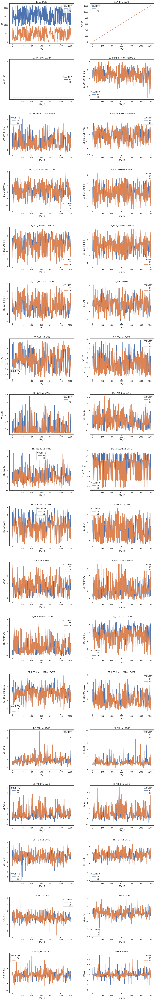

In [ ]:
plt.figure(figsize=(15, 100))

features = XY_df.columns.tolist()

for index, column in enumerate(features[:]):
    plt.subplot(20, 2, index + 1)
    sns.lineplot(x=XY_df['DAY_ID'], y=XY_df[column], hue=XY_df['COUNTRY'])
    plt.title(f'{column} vs DAYID')

plt.tight_layout(pad=4.0)
plt.show()

##Missing values

In [ ]:
# I already removed FR_NET_IMPORT and DE_NET_IMPORT, because it is the same data as _EXPORT columns!
#Also, to make it simpler, I only use DE_FR_EXCHANGE (not FR_DE_EXCHANGE) because both means the same thing too.
#Remove and create features if necessary.
features_FR = ['ID',
          'DAY_ID',
          'FR_CONSUMPTION',
          'DE_FR_EXCHANGE',
          'FR_NET_EXPORT',
          'FR_GAS',
          'FR_COAL',
          'FR_HYDRO',
          'FR_NUCLEAR',
          'FR_SOLAR',
          'FR_WINDPOW',
          'FR_RESIDUAL_LOAD',
          'FR_RAIN',
          'FR_WIND',
          'FR_TEMP',
          'GAS_RET',
          'COAL_RET',
          'CARBON_RET',
          'TARGET']
features_DE = ['ID',
          'DAY_ID',
          'DE_CONSUMPTION',
          'DE_FR_EXCHANGE',
          'DE_NET_EXPORT',
          'DE_GAS',
          'DE_COAL',
          'DE_HYDRO',
          'DE_NUCLEAR',
          'DE_SOLAR',
          'DE_WINDPOW',
          'DE_LIGNITE',
          'DE_RESIDUAL_LOAD',
          'DE_RAIN',
          'DE_WIND',
          'DE_TEMP',
          'GAS_RET',
          'COAL_RET',
          'CARBON_RET',
          'TARGET']

In [ ]:
from sklearn.model_selection import train_test_split
# Separate the data into 'FR' and 'DE' groups
dataset_FR = XY_df[XY_df['COUNTRY'] == 'FR']
dataset_DE = XY_df[XY_df['COUNTRY'] == 'DE']
dataset_FR = dataset_FR[features_FR].copy()
dataset_DE = dataset_DE[features_DE].copy()

# Prepare data for 'FR' group (split into training and validation data)
X_FR = dataset_FR.drop(columns=['TARGET'])
Y_FR = dataset_FR['TARGET']
X_train_FR_initial, X_val_FR_initial, Y_train_FR_initial, Y_val_FR_initial = train_test_split(X_FR, Y_FR, test_size=0.3, random_state=42)

# Prepare data for 'DE' group
X_DE = dataset_DE.drop(columns=['TARGET'])
Y_DE = dataset_DE['TARGET']
X_train_DE_initial, X_val_DE_initial, Y_train_DE_initial, Y_val_DE_initial = train_test_split(X_DE, Y_DE, test_size=0.3, random_state=42)
print(X_train_FR_initial.shape)
print(X_train_DE_initial.shape)


(595, 18)
(450, 19)


Y value
since the plot is close to Gaussian distribution, we don't need to care much about outliers.

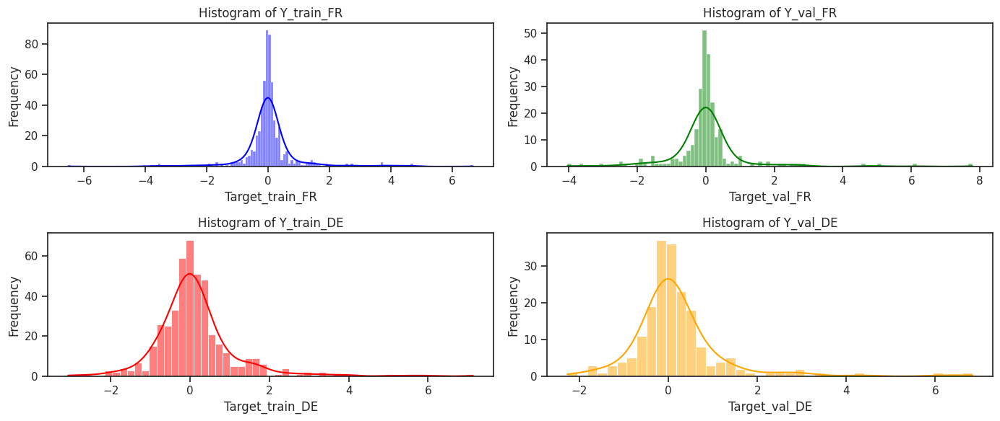

In [ ]:
# Set the figure size
plt.figure(figsize=(14, 6))

# Set the style
sns.set(style="ticks")

# Plot histograms for Y_train_FR and Y_val_FR
plt.subplot(2, 2, 1)
sns.histplot(Y_train_FR_initial, kde=True, color='blue')
plt.title('Histogram of Y_train_FR')
plt.xlabel('Target_train_FR')
plt.ylabel('Frequency')

plt.subplot(2, 2, 2)
sns.histplot(Y_val_FR_initial, kde=True, color='green')
plt.title('Histogram of Y_val_FR')
plt.xlabel('Target_val_FR')
plt.ylabel('Frequency')

# Plot histograms for Y_train_DE and Y_val_DE
plt.subplot(2, 2, 3)
sns.histplot(Y_train_DE_initial, kde=True, color='red')
plt.title('Histogram of Y_train_DE')
plt.xlabel('Target_train_DE')
plt.ylabel('Frequency')

plt.subplot(2, 2, 4)
sns.histplot(Y_val_DE_initial, kde=True, color='orange')
plt.title('Histogram of Y_val_DE')
plt.xlabel('Target_val_DE')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np

# Define a function to remove outliers using IQR
def remove_outliers_iqr(data):
    Q1 = np.percentile(data, 45)
    Q3 = np.percentile(data, 55)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return np.where((data > lower_bound) & (data < upper_bound))

# Find indices of outliers for FR group using IQR
outliers_FR_indices_iqr = remove_outliers_iqr(Y_train_FR_initial)

# Find indices of outliers for DE group using IQR
outliers_DE_indices_iqr = remove_outliers_iqr(Y_train_DE_initial)

# Remove rows corresponding to outliers from X_train_FR and X_train_DE using IQR
X_train_FR_filtered_iqr = X_train_FR_initial.drop(X_train_FR_initial.index[outliers_FR_indices_iqr[0]])
X_train_DE_filtered_iqr = X_train_DE_initial.drop(X_train_DE_initial.index[outliers_DE_indices_iqr[0]])

Y_train_FR_filtered_iqr = Y_train_FR_initial.drop(Y_train_FR_initial.index[outliers_FR_indices_iqr[0]])
Y_train_DE_filtered_iqr = Y_train_DE_initial.drop(Y_train_DE_initial.index[outliers_DE_indices_iqr[0]])

print(f"Number of outliers removed from FR group using IQR: {len(outliers_FR_indices_iqr[0])}")
print(f"Number of outliers removed from DE group using IQR: {len(outliers_DE_indices_iqr[0])}")
print(X_train_FR_filtered_iqr.shape)
print(X_train_DE_filtered_iqr.shape)


Number of outliers removed from FR group using IQR: 199
Number of outliers removed from DE group using IQR: 162
(396, 18)
(288, 19)


In [ ]:
from scipy import stats
# Calculate z-scores for Y_train_FR and Y_train_DE
z_scores_FR = stats.zscore(Y_train_FR_initial)
z_scores_DE = stats.zscore(Y_train_DE_initial)

# Define threshold for z-score (e.g., consider values with z-score less than 3 as outliers)
threshold = 3

# Find indices of outliers for FR group
outliers_FR_indices = np.where(np.abs(z_scores_FR) > threshold)[0]

# Find indices of outliers for DE group
outliers_DE_indices = np.where(np.abs(z_scores_DE) > threshold)[0]

# Remove rows corresponding to outliers from X_train_FR and X_train_DE
X_train_FR_filtered = X_train_FR_initial.drop(X_train_FR_initial.index[outliers_FR_indices])
X_train_DE_filtered = X_train_DE_initial.drop(X_train_DE_initial.index[outliers_DE_indices])

Y_train_FR_filtered = Y_train_FR_initial.drop(Y_train_FR_initial.index[outliers_FR_indices])
Y_train_DE_filtered = Y_train_DE_initial.drop(Y_train_DE_initial.index[outliers_DE_indices])


print(f"Number of outliers removed from FR group: {len(outliers_FR_indices)}")
print(f"Number of outliers removed from DE group: {len(outliers_DE_indices)}")
print(X_train_FR_filtered.shape)
print(X_train_DE_filtered.shape)


Number of outliers removed from FR group: 21
Number of outliers removed from DE group: 10
(574, 18)
(440, 19)


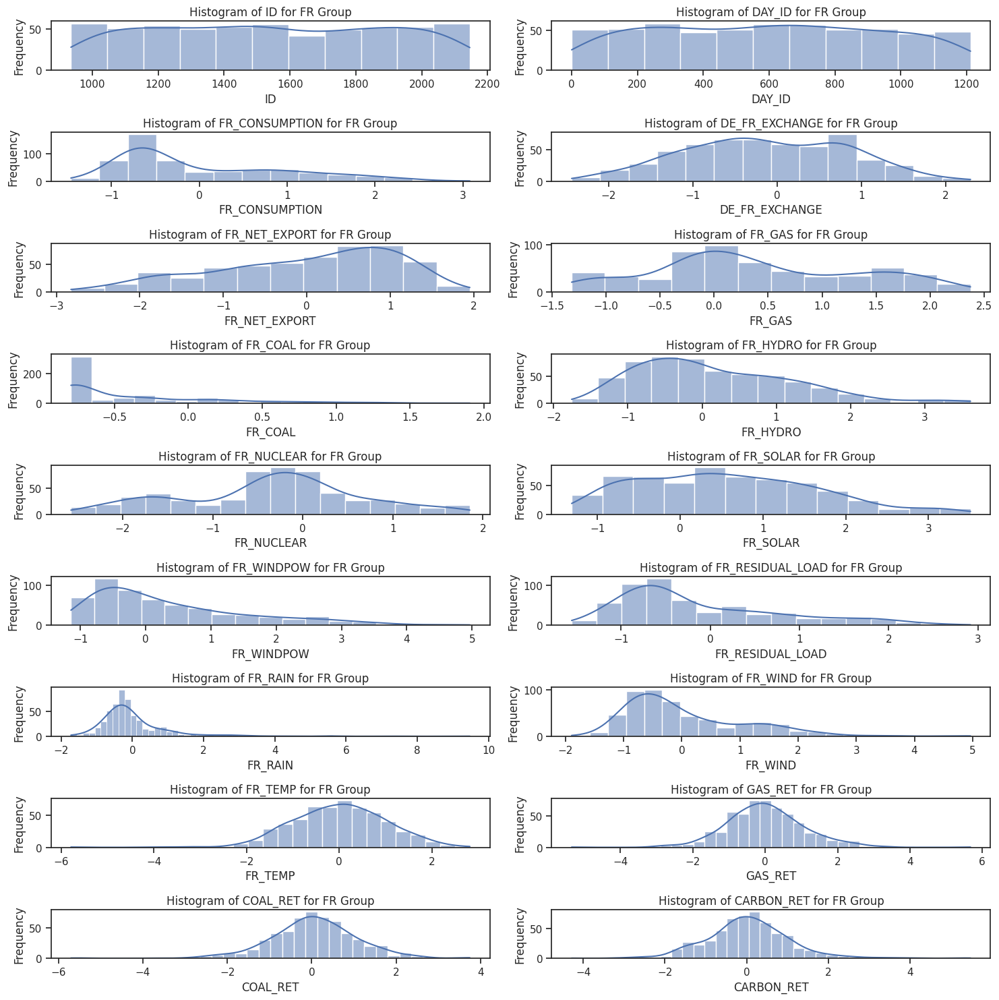

In [ ]:
#Remove outliers
#See the distribution
import math

plt.figure(figsize=(15, 15))
sns.set(style="ticks")
columns_FR = X_train_FR_filtered.columns.to_list()
num_plots = len(columns_FR)
num_rows = math.ceil(num_plots / 2)

for i, column in enumerate(columns_FR, start=1):
    plt.subplot(num_rows, 2, i)
    sns.histplot(X_train_FR_filtered[column], kde=True)
    plt.title(f'Histogram of {column} for FR Group')
    plt.xlabel(f'{column}')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

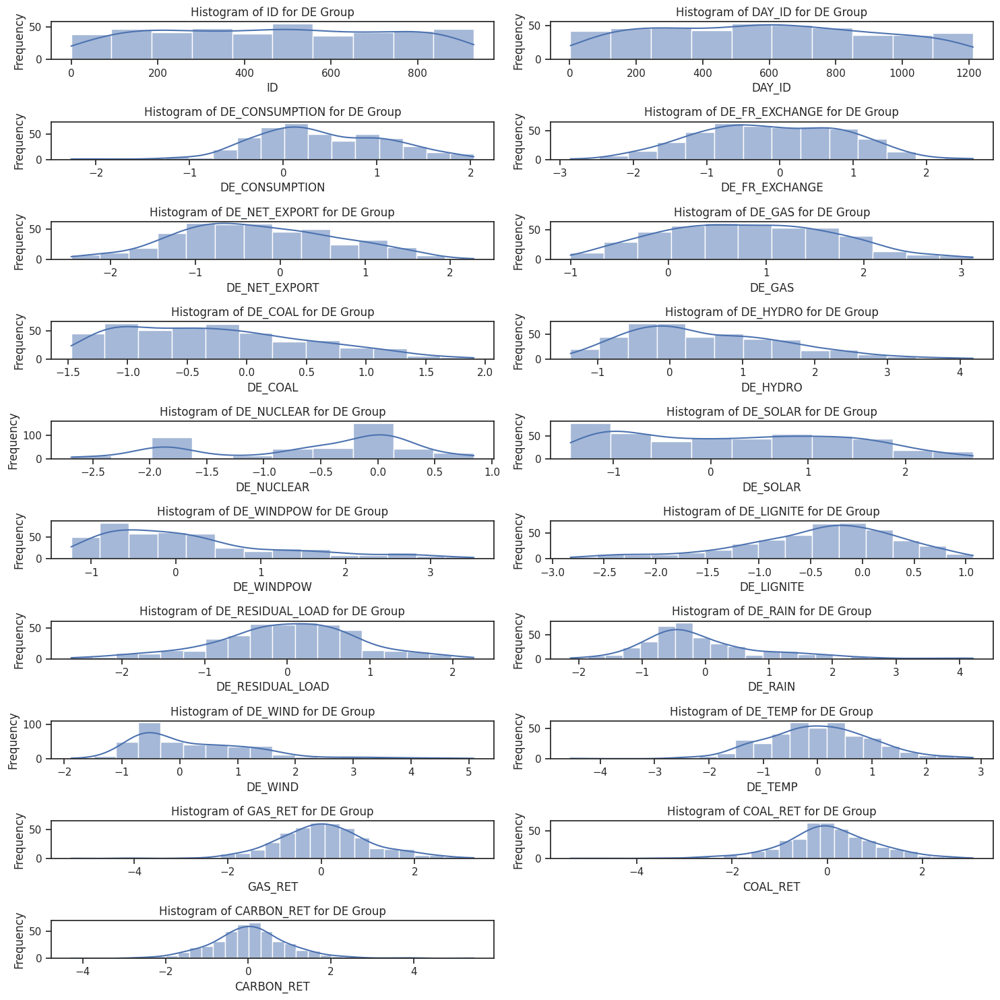

In [ ]:
#See the distribution
import math

plt.figure(figsize=(15, 15))
sns.set(style="ticks")
columns_DE = X_train_DE_filtered.columns.to_list()
num_plots = len(columns_DE)
num_rows = math.ceil(num_plots / 2)

for i, column in enumerate(columns_DE, start=1):
    plt.subplot(num_rows, 2, i)
    sns.histplot(X_train_DE_filtered[column], kde=True)
    plt.title(f'Histogram of {column} for DE Group')
    plt.xlabel(f'{column}')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
print(X_train_FR_initial.shape)
print(X_train_DE_initial.shape)

(595, 18)
(450, 19)


In [ ]:
# #Choose whether with or without outliers
X_train_FR_tf = X_train_FR_filtered.copy()
X_train_DE_tf = X_train_DE_filtered.copy()
X_val_FR_tf = X_val_FR_initial.copy()
X_val_DE_tf = X_val_DE_initial.copy()

In [ ]:
#Check skewness
features_FR = X_train_FR_tf.columns.tolist()
skewness_FR = X_train_FR_tf[features_FR].skew().sort_values(ascending=False)
skewness_FR

FR_RAIN             3.370859
FR_COAL             1.503567
FR_WIND             1.281843
FR_WINDPOW          1.151740
FR_RESIDUAL_LOAD    0.989822
FR_CONSUMPTION      0.858357
FR_HYDRO            0.770836
CARBON_RET          0.555208
FR_SOLAR            0.420089
FR_GAS              0.222052
GAS_RET             0.218137
DAY_ID              0.029842
ID                  0.016472
DE_FR_EXCHANGE     -0.012347
FR_NUCLEAR         -0.132520
FR_TEMP            -0.426419
COAL_RET           -0.433625
FR_NET_EXPORT      -0.523231
dtype: float64

In [ ]:
features_DE = X_train_DE_tf.columns.tolist()
skewness_DE = X_train_DE_tf[features_DE].skew().sort_values(ascending=False)
skewness_DE

DE_WIND             1.384996
DE_RAIN             1.327224
DE_WINDPOW          1.068294
CARBON_RET          0.724748
DE_HYDRO            0.687457
DE_COAL             0.504005
DE_SOLAR            0.177394
DE_GAS              0.169110
DE_NET_EXPORT       0.138728
DAY_ID              0.089054
ID                  0.005640
DE_FR_EXCHANGE     -0.009519
DE_CONSUMPTION     -0.072225
DE_TEMP            -0.091886
DE_RESIDUAL_LOAD   -0.254982
GAS_RET            -0.261892
COAL_RET           -0.621443
DE_NUCLEAR         -0.642547
DE_LIGNITE         -0.777721
dtype: float64

In [ ]:
#Log transformation for the features with positive skewness
high_skew_columns_FR = skewness_FR[skewness_FR > 1].index

# Calculate the minimum value for both X_train_FR and X_val_FR
min_value_train = X_train_FR_tf[high_skew_columns_FR].min().min()
min_value_val = X_val_FR_tf[high_skew_columns_FR].min().min()
min_value = min(min_value_train, min_value_val)


# Apply log transformation to columns with high skewness
for column in high_skew_columns_FR:
    # Shift the data to ensure all values are positive
    shifted_data_train = X_train_FR_tf[column] - min_value + 1  # Add 1 to shift all values to positive range
    shifted_data_val = X_val_FR_tf[column] - min_value + 1  # Add 1 to shift all values to positive range
    X_train_FR_tf[column + '_log_transformed'] = np.log(shifted_data_train)
    X_val_FR_tf[column + '_log_transformed'] = np.log(shifted_data_val)

# Calculate the skewness of the log-transformed columns
log_transformed_skewness_train = X_train_FR_tf[[col + '_log_transformed' for col in high_skew_columns_FR]].skew()
log_transformed_skewness_val = X_val_FR_tf[[col + '_log_transformed' for col in high_skew_columns_FR]].skew()

# Display the skewness of the log-transformed columns
print("Train Skewness:\n", log_transformed_skewness_train)
print("\nValidation Skewness:\n", log_transformed_skewness_val)

Train Skewness:
 FR_RAIN_log_transformed       1.039504
FR_COAL_log_transformed       1.176092
FR_WIND_log_transformed       0.483900
FR_WINDPOW_log_transformed    0.557800
dtype: float64

Validation Skewness:
 FR_RAIN_log_transformed       1.483973
FR_COAL_log_transformed       0.915559
FR_WIND_log_transformed       0.417155
FR_WINDPOW_log_transformed    0.556856
dtype: float64


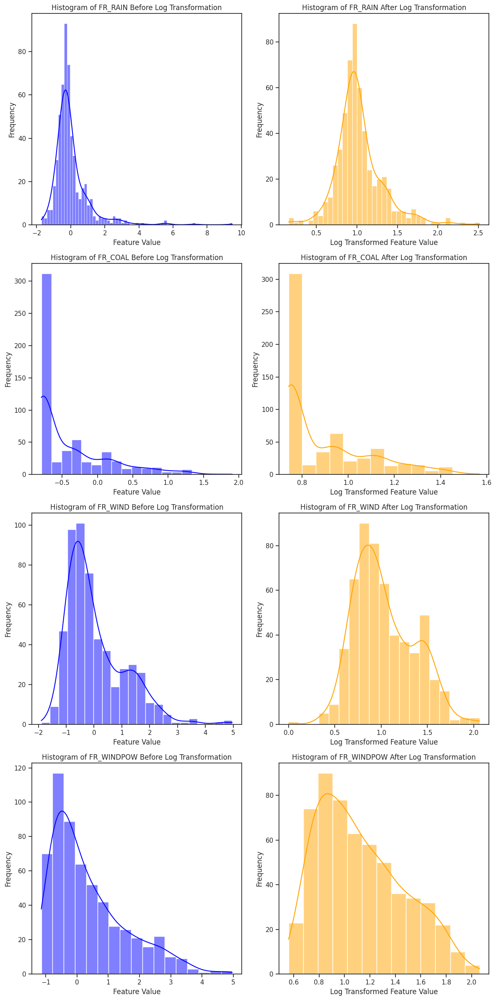

In [ ]:
# Initialize the figure
plt.figure(figsize=(12, 6 * len(high_skew_columns_FR)))

# Plot histograms for features before and after log transformation
for i, column in enumerate(high_skew_columns_FR, start=1):
    plt.subplot(len(high_skew_columns_FR), 2, i * 2 - 1)
    sns.histplot(X_train_FR_tf[column], kde=True, color='blue')
    plt.title(f'Histogram of {column} Before Log Transformation')
    plt.xlabel('Feature Value')
    plt.ylabel('Frequency')

    plt.subplot(len(high_skew_columns_FR), 2, i * 2)
    sns.histplot(X_train_FR_tf[column + '_log_transformed'], kde=True, color='orange')
    plt.title(f'Histogram of {column} After Log Transformation')
    plt.xlabel('Log Transformed Feature Value')
    plt.ylabel('Frequency')

    plt.tight_layout()

plt.show()

In [ ]:
#Log transformation for the features with positive skewness
high_skew_columns_DE = skewness_DE[skewness_DE > 1].index

# Calculate the minimum value for both X_train_FR and X_val_FR
min_value_train = X_train_DE_tf[high_skew_columns_DE].min().min()
min_value_val = X_val_DE_tf[high_skew_columns_DE].min().min()
min_value = min(min_value_train, min_value_val)

# Apply log transformation to columns with high skewness
for column in high_skew_columns_DE:
    # Shift the data to ensure all values are positive
    shifted_data_train = X_train_DE_tf[column] - min_value + 1  # Add 1 to shift all values to positive range
    shifted_data_val = X_val_DE_tf[column] - min_value + 1  # Add 1 to shift all values to positive range
    X_train_DE_tf[column + '_log_transformed'] = np.log(shifted_data_train)
    X_val_DE_tf[column + '_log_transformed'] = np.log(shifted_data_val)

# Calculate the skewness of the log-transformed columns
log_transformed_skewness_train = X_train_DE_tf[[col + '_log_transformed' for col in high_skew_columns_DE]].skew()
log_transformed_skewness_val = X_val_DE_tf[[col + '_log_transformed' for col in high_skew_columns_DE]].skew()

# Display the skewness of the log-transformed columns
print("Train Skewness:\n", log_transformed_skewness_train)
print("\nValidation Skewness:\n", log_transformed_skewness_val)

Train Skewness:
 DE_WIND_log_transformed       0.546706
DE_RAIN_log_transformed       0.243849
DE_WINDPOW_log_transformed    0.517095
dtype: float64

Validation Skewness:
 DE_WIND_log_transformed       0.685522
DE_RAIN_log_transformed       0.957999
DE_WINDPOW_log_transformed    0.515865
dtype: float64


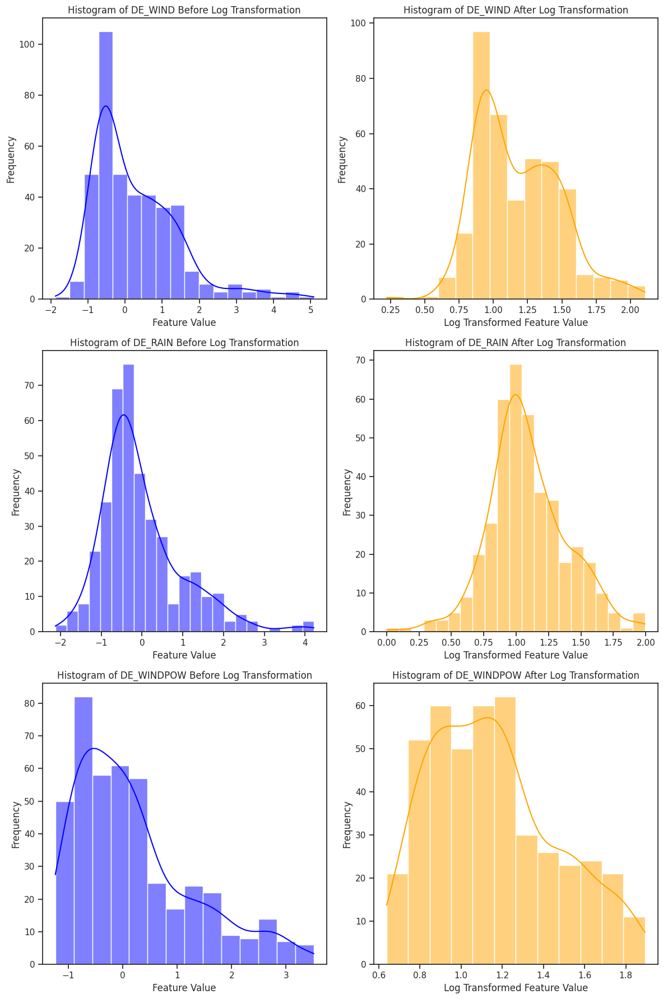

In [ ]:
# Initialize the figure
plt.figure(figsize=(12, 6 * len(high_skew_columns_DE)))

# Plot histograms for features before and after log transformation
for i, column in enumerate(high_skew_columns_DE, start=1):
    plt.subplot(len(high_skew_columns_DE), 2, i * 2 - 1)
    sns.histplot(X_train_DE_tf[column], kde=True, color='blue')
    plt.title(f'Histogram of {column} Before Log Transformation')
    plt.xlabel('Feature Value')
    plt.ylabel('Frequency')

    plt.subplot(len(high_skew_columns_DE), 2, i * 2)
    sns.histplot(X_train_DE_tf[column + '_log_transformed'], kde=True, color='orange')
    plt.title(f'Histogram of {column} After Log Transformation')
    plt.xlabel('Log Transformed Feature Value')
    plt.ylabel('Frequency')

    plt.tight_layout()

plt.show()

In [ ]:
#We are not going to use transformed data
X_train_FR_to_inpute =X_train_FR_filtered
X_val_FR_to_inpute  = X_val_FR_initial
X_train_DE_to_inpute  =X_train_DE_filtered
X_val_DE_to_inpute = X_val_DE_initial

In [ ]:
X_train_FR_filtered

,ID,DAY_ID,FR_CONSUMPTION,DE_FR_EXCHANGE,FR_NET_EXPORT,FR_GAS,FR_COAL,FR_HYDRO,FR_NUCLEAR,FR_SOLAR,FR_WINDPOW,FR_RESIDUAL_LOAD,FR_RAIN,FR_WIND,FR_TEMP,GAS_RET,COAL_RET,CARBON_RET
333,1816,463,-1.075021,-0.233193,1.193040,-1.296714,-0.783387,-0.769683,-0.247240,1.115779,-0.126718,-1.107888,-0.350293,1.835246,-1.327874,-1.590973,-0.689343,-0.615338
476,1655,1018,1.167650,1.536295,-0.866873,0.561554,-0.786761,-0.667643,0.877698,-0.791743,0.198801,1.132260,-0.065021,-0.464553,-0.554078,-0.710437,-0.887705,0.432228
1480,1768,733,-0.687410,-0.618131,0.955215,-0.280083,-0.783776,0.659543,-0.413227,2.187873,-0.862032,-0.643051,-0.914978,0.612994,1.424667,2.910326,0.228787,0.445762
1462,1267,948,-0.545477,-1.236892,1.286191,-0.473933,-0.774819,-0.341474,-0.019049,1.031410,-0.267895,-0.545280,-0.089715,-0.657707,1.420174,-0.269594,1.652322,-0.504719
239,1628,730,0.552922,0.368222,-0.398678,1.384810,-0.518217,-0.038030,0.420854,-0.289785,-0.249251,0.624534,-0.717136,-0.741944,-0.244468,0.602402,0.497460,-0.202951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,1271,353,-0.309950,-1.068866,0.964457,-0.023867,-0.767167,-0.125165,-0.123130,1.374199,-0.124131,-0.369704,-0.968016,-0.576181,1.374359,0.306638,-0.926153,0.105517
175,2072,996,-1.080035,-0.448127,-1.628336,-0.029368,-0.775944,-0.893704,-2.227418,1.936018,-0.672341,-1.047487,5.537767,0.545667,0.831607,0.760423,0.529184,0.459317
471,1014,876,-0.234745,-0.870278,NaN,-0.963118,-0.375583,1.064346,0.319523,0.254204,-0.034719,-0.238614,0.157236,-0.551181,0.530652,0.000000,-0.852656,0.194699
770,999,534,-0.711287,-0.352507,NaN,-1.189782,-0.794950,0.566977,0.034870,0.092559,-0.605783,-0.573830,-0.277063,-0.726852,0.691692,0.412735,-0.481052,0.360036


In [ ]:
#Dataset-1:Inpute median
#Make a copy

X_train_FR_1, X_val_FR_1, Y_train_FR_1, Y_val_FR_1 = X_train_FR_to_inpute.copy(), X_val_FR_to_inpute.copy(), Y_train_FR_filtered.copy(), Y_val_FR_initial.copy()
X_train_DE_1, X_val_DE_1, Y_train_DE_1, Y_val_DE_1 = X_train_DE_to_inpute.copy(), X_val_DE_to_inpute.copy(), Y_train_DE_filtered.copy(), Y_val_DE_initial.copy()

missing_columns_FR_train_1 = X_train_FR_1.isna().any()
for column in missing_columns_FR_train_1[missing_columns_FR_train_1].index:
    median_value_FR = X_train_FR_1[column].median()
    X_train_FR_1[column].fillna(median_value_FR, inplace=True)

# Fill missing values with median in the validation set
for column in missing_columns_FR_train_1[missing_columns_FR_train_1].index:
    X_val_FR_1[column].fillna(median_value_FR, inplace=True)

missing_columns_DE_train_1 = X_train_DE_1.isna().any()
for column in missing_columns_DE_train_1[missing_columns_DE_train_1].index:
    median_value_DE = X_train_DE_1[column].median()
    X_train_DE_1[column].fillna(median_value_DE, inplace=True)

# Fill missing values with median in the validation set
for column in missing_columns_DE_train_1[missing_columns_DE_train_1].index:
    X_val_DE_1[column].fillna(median_value_DE, inplace=True)

In [ ]:
#Dataset-2:Inpute mean
#Make a copy
X_train_FR_2, X_val_FR_2, Y_train_FR_2, Y_val_FR_2 = X_train_FR_to_inpute.copy(), X_val_FR_to_inpute.copy(), Y_train_FR_filtered.copy(), Y_val_FR_initial.copy()
X_train_DE_2, X_val_DE_2, Y_train_DE_2, Y_val_DE_2 = X_train_DE_to_inpute.copy(), X_val_DE_to_inpute.copy(), Y_train_DE_filtered.copy(), Y_val_DE_initial.copy()

missing_columns_FR_train_2 = X_train_FR_2.isna().any()
for column in missing_columns_FR_train_2[missing_columns_FR_train_2].index:
    mean_value_FR = X_train_FR_2[column].mean()
    X_train_FR_2[column].fillna(mean_value_FR, inplace=True)

# Fill missing values with median in the validation set
for column in missing_columns_FR_train_2[missing_columns_FR_train_2].index:
    X_val_FR_2[column].fillna(mean_value_FR, inplace=True)

missing_columns_DE_train_2 = X_train_DE_2.isna().any()
for column in missing_columns_DE_train_2[missing_columns_DE_train_2].index:
    mean_value_DE = X_train_DE_2[column].mean()
    X_train_DE_2[column].fillna(mean_value_DE, inplace=True)

# Fill missing values with median in the validation set
for column in missing_columns_DE_train_2[missing_columns_DE_train_2].index:
    X_val_DE_2[column].fillna(mean_value_DE, inplace=True)
print(X_train_FR_2.shape)

(574, 18)


In [ ]:
#Dataset-3: with KNN
from sklearn.impute import KNNImputer

X_train_FR_3, X_val_FR_3, Y_train_FR_3, Y_val_FR_3 = X_train_FR_to_inpute.copy(), X_val_FR_to_inpute.copy(), Y_train_FR_filtered.copy(), Y_val_FR_initial.copy()
X_train_DE_3, X_val_DE_3, Y_train_DE_3, Y_val_DE_3 = X_train_DE_to_inpute.copy(), X_val_DE_to_inpute.copy(), Y_train_DE_filtered.copy(), Y_val_DE_initial.copy()

# Initialize KNN imputer for FR dataset
imputer_FR = KNNImputer(n_neighbors=5)

# Fit and transform the training set copy
X_train_FR_for_knn = imputer_FR.fit_transform(X_train_FR_3.copy())

# Transform the validation set copy
X_val_FR_for_knn = imputer_FR.transform(X_val_FR_3.copy())

# Convert the arrays back to DataFrame with the same columns
X_train_FR_3 = pd.DataFrame(X_train_FR_for_knn, columns=X_train_FR_3.columns)
X_val_FR_3 = pd.DataFrame(X_val_FR_for_knn, columns=X_val_FR_3.columns)

# Initialize KNN imputer for DE dataset
imputer_DE = KNNImputer(n_neighbors=5)

# Fit and transform the training set copy
X_train_DE_for_knn = imputer_DE.fit_transform(X_train_DE_3.copy())

# Transform the validation set copy
X_val_DE_for_knn = imputer_DE.transform(X_val_DE_3.copy())

# Convert the arrays back to DataFrame with the same columns
X_train_DE_3 = pd.DataFrame(X_train_DE_for_knn, columns=X_train_DE_3.columns)
X_val_DE_3 = pd.DataFrame(X_val_DE_for_knn, columns=X_val_DE_3.columns)


#Modelling

##Feature selection

In [ ]:
# I already removed FR_NET_IMPORT and DE_NET_IMPORT, because it is the same data as _EXPORT columns!
#Also, to make it simpler, I only use DE_FR_EXCHANGE (not FR_DE_EXCHANGE) because both means the same thing too.
#Remove and create features if necessary.
features_FR_selected = ['ID',
          'DAY_ID',
          # 'FR_CONSUMPTION',# High correlation with other features
          'DE_FR_EXCHANGE',
          'FR_NET_EXPORT',
          # 'FR_GAS',

          'FR_HYDRO',
          'FR_NUCLEAR',
          'FR_SOLAR',
          'FR_RESIDUAL_LOAD', # High correlation with other features

          'FR_TEMP',
          'GAS_RET',
          'COAL_RET',
          'CARBON_RET',
           'FR_COAL',
           'FR_WINDPOW',
           'FR_RAIN',
           'FR_WIND'
          # 'FR_RAIN_log_transformed',
          # 'FR_COAL_log_transformed',
          # 'FR_WIND_log_transformed',
          # 'FR_WINDPOW_log_transformed'
                        ]
features_DE_selected = ['ID', #High correlation with other features
          'DAY_ID',
          'DE_CONSUMPTION',# High correlation with other features
          'DE_FR_EXCHANGE',
          'DE_NET_EXPORT',
          'DE_GAS',
          'DE_COAL',
          'DE_HYDRO',
          'DE_NUCLEAR',
          'DE_SOLAR',

          'DE_LIGNITE',
          'DE_RESIDUAL_LOAD',

          'DE_TEMP',
          'GAS_RET',
          'COAL_RET',
          'CARBON_RET',
          'DE_WINDPOW',
          'DE_RAIN',
          'DE_WIND'
          # 'DE_WIND_log_transformed',
          # 'DE_RAIN_log_transformed',
          # 'DE_WINDPOW_log_transformed'
                        ]

#Model creation

In [ ]:
X_train_FR_final, X_val_FR_final, Y_train_FR_final, Y_val_FR_final = X_train_FR_2, X_val_FR_2, Y_train_FR_2, Y_val_FR_2
X_train_DE_final, X_val_DE_final, Y_train_DE_final, Y_val_DE_final = X_train_DE_2, X_val_DE_2, Y_train_DE_2, Y_val_DE_2

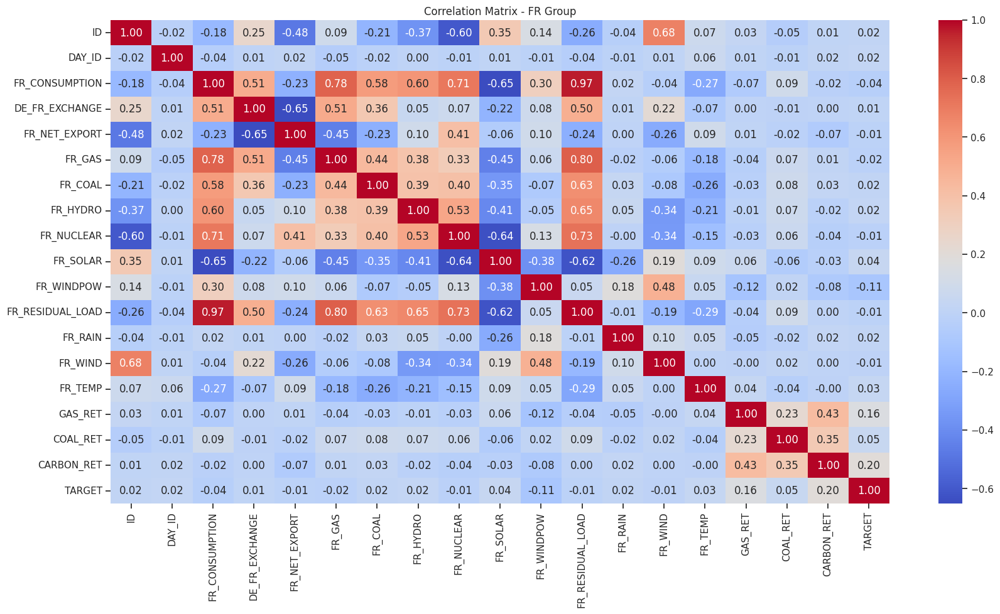

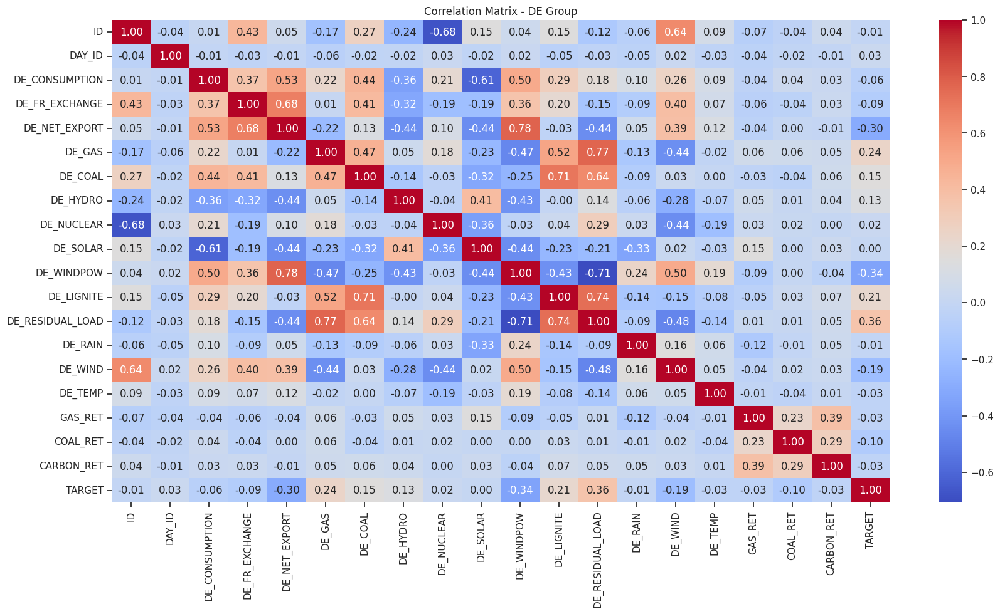

In [ ]:
# Concatenate X_train_FR and Y_train_FR along rows (axis=0)
train_FR_correlation = pd.concat([X_train_FR_final, Y_train_FR_final], axis=1)

# Calculate the correlation matrix
corr_matrix_FR = train_FR_correlation.corr()

# Plot the heatmap for the concatenated dataset
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix_FR, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - FR Group')
plt.show()

# Concatenate X_train_DE and Y_train_DE along rows (axis=0)
train_DE_correlation = pd.concat([X_train_DE_final, Y_train_DE_final], axis=1)

# Calculate the correlation matrix
corr_matrix_DE = train_DE_correlation.corr()

# Plot the heatmap for DE group
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix_DE, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - DE Group')
plt.show()

In [ ]:

X_train_FR = X_train_FR_final[features_FR_selected].copy()
X_train_DE = X_train_DE_final[features_DE_selected].copy()
X_val_FR = X_val_FR_final[features_FR_selected].copy()
X_val_DE = X_val_DE_final[features_DE_selected].copy()
Y_train_FR = Y_train_FR_final
Y_val_FR = Y_val_FR_final
Y_train_DE = Y_train_DE_final
Y_val_DE = Y_val_DE_final

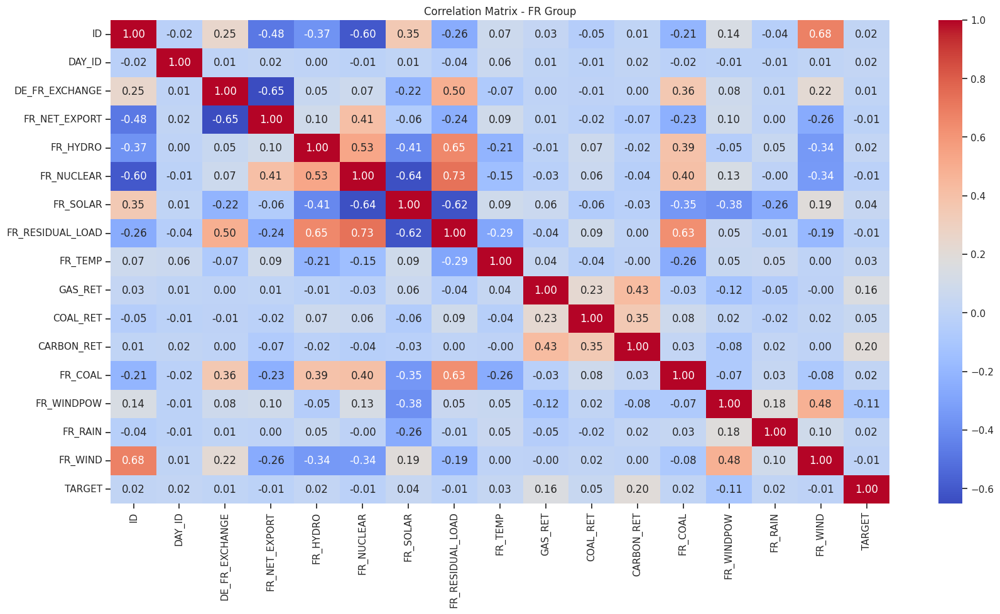

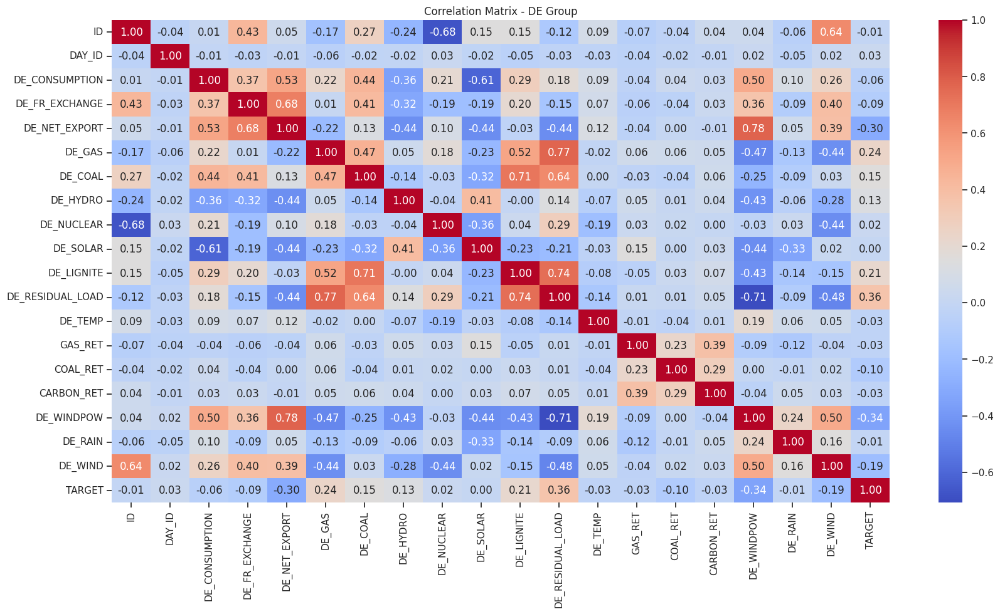

In [ ]:
# Concatenate X_train_FR and Y_train_FR along rows (axis=0)
train_FR_correlation = pd.concat([X_train_FR, Y_train_FR], axis=1)

# Calculate the correlation matrix
corr_matrix_FR = train_FR_correlation.corr()

# Plot the heatmap for the concatenated dataset
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix_FR, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - FR Group')
plt.show()

# Concatenate X_train_DE and Y_train_DE along rows (axis=0)
train_DE_correlation = pd.concat([X_train_DE, Y_train_DE], axis=1)

# Calculate the correlation matrix
corr_matrix_DE = train_DE_correlation.corr()

# Plot the heatmap for DE group
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix_DE, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - DE Group')
plt.show()

### Feature Creation

In [ ]:
# Create interaction features for the French dataset
X_train_FR['GAS_RET_FR_TEMP'] = X_train_FR['GAS_RET'] * X_train_FR['FR_TEMP'] #This interaction could capture how gas demand (and thus price) varies with temperature changes.
X_train_FR['SOLAR_WINDPOW_INTERACTION'] = X_train_FR['FR_SOLAR'] * X_train_FR['FR_WINDPOW'] #To examine how solar and wind energy productions might complement or compete with each other on any given day.
X_train_FR['CARBON_RET_FR_RAIN'] = X_train_FR['CARBON_RET'] * X_train_FR['FR_RAIN'] #Since rain might affect both the demand for carbon (through cooling and heating needs) and the production of hydroelectric power, this interaction could be insightful.

# Create interaction features for the German dataset
X_train_DE['GAS_RET_DE_TEMP'] = X_train_DE['GAS_RET'] * X_train_DE['DE_TEMP']
X_train_DE['SOLAR_WINDPOW_INTERACTION'] = X_train_DE['DE_SOLAR'] * X_train_DE['DE_WINDPOW']
X_train_DE['CARBON_RET_DE_RAIN'] = X_train_DE['CARBON_RET'] * X_train_DE['DE_RAIN']



In [ ]:
# Create interaction features for the French validation dataset
X_val_FR['GAS_RET_FR_TEMP'] = X_val_FR['GAS_RET'] * X_val_FR['FR_TEMP']
X_val_FR['SOLAR_WINDPOW_INTERACTION'] = X_val_FR['FR_SOLAR'] * X_val_FR['FR_WINDPOW']
X_val_FR['CARBON_RET_FR_RAIN'] = X_val_FR['CARBON_RET'] * X_val_FR['FR_RAIN']

# Create interaction features for the German validation dataset
X_val_DE['GAS_RET_DE_TEMP'] = X_val_DE['GAS_RET'] * X_val_DE['DE_TEMP']
X_val_DE['SOLAR_WINDPOW_INTERACTION'] = X_val_DE['DE_SOLAR'] * X_val_DE['DE_WINDPOW']
X_val_DE['CARBON_RET_DE_RAIN'] = X_val_DE['CARBON_RET'] * X_val_DE['DE_RAIN']


In [ ]:
def add_lag_features(dataframe, column_name, lag_days=1):
    """
    Adds lag features to the specified dataframe based on the given column name.

    Parameters:
    - dataframe: Pandas DataFrame to which the lag features will be added.
    - column_name: The name of the column for which to create lag features.
    - lag_days: Number of days to lag behind. Default is 1.

    Returns:
    - DataFrame with the new lag feature(s) added.
    """
    for i in range(1, lag_days + 1):
        lag_feature_name = f"{column_name}_lag_{i}"
        dataframe[lag_feature_name] = dataframe[column_name].shift(i)
    return dataframe

# Specify the commodity price columns for which we want to create lag features
commodity_columns = ['GAS_RET', 'COAL_RET',  'CARBON_RET']  # Add more columns as needed

# Apply the function to the datasets
for column in commodity_columns:
    X_train_FR = add_lag_features(X_train_FR, column, lag_days=1)
    X_train_DE = add_lag_features(X_train_DE, column, lag_days=1)
    X_val_FR = add_lag_features(X_val_FR, column, lag_days=1)
    X_val_DE = add_lag_features(X_val_DE, column, lag_days=1)

# Using backward fill for Nan values
X_train_FR.fillna(method='bfill', inplace=True)
X_train_DE.fillna(method='bfill', inplace=True)
X_val_FR.fillna(method='bfill', inplace=True)
X_val_DE.fillna(method='bfill', inplace=True)



In [ ]:
from sklearn.preprocessing import PolynomialFeatures
def create_poly_features(dataframe, feature_names, degree=2, remove_original=False):
    """
    Generates polynomial features for the specified features within the dataframe, with an option to remove original features.

    Parameters:
    - dataframe: The input DataFrame.
    - feature_names: List of column names to be used for generating polynomial features.
    - degree: The degree of the polynomial features.
    - remove_original: Boolean indicating whether to remove the original features used for polynomial generation.

    Returns:
    - DataFrame with original data (minus selected features if remove_original is True) and new polynomial features.
    """
    # Select relevant features
    features = dataframe[feature_names]

    # Instantiate and apply PolynomialFeatures
    poly = PolynomialFeatures(degree=degree, include_bias=False)
    poly_features = poly.fit_transform(features)

    # Generate a DataFrame for the new polynomial features
    poly_features_df = pd.DataFrame(poly_features, columns=poly.get_feature_names_out(feature_names))

    # Optionally remove the original features
    if remove_original:
        dataframe = dataframe.drop(columns=feature_names)

    # Concatenate the new polynomial features with the original dataframe
    dataframe_enhanced = pd.concat([dataframe.reset_index(drop=True), poly_features_df], axis=1)

    return dataframe_enhanced


# Feature names to create polynomial features
feature_names = ['FR_TEMP', 'GAS_RET']

# Apply the function to each dataset
X_train_FR = create_poly_features(X_train_FR, feature_names, remove_original=True)
X_val_FR = create_poly_features(X_val_FR, feature_names,remove_original=True)


feature_names_DE = ['DE_TEMP', 'GAS_RET']
X_train_DE = create_poly_features(X_train_DE, feature_names_DE, remove_original=True)
X_val_DE = create_poly_features(X_val_DE, feature_names_DE, remove_original=True)



In [ ]:
from sklearn.tree import  DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor,GradientBoostingRegressor,AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [ ]:
random_seed = 42
models_FR = {
    'Decision Tree_FR': DecisionTreeRegressor(random_state=random_seed),
    'Random Forest_FR': RandomForestRegressor(max_depth= 5, min_samples_leaf=4, min_samples_split= 2, n_estimators= 150, random_state=random_seed),
    'ExtraTrees_FR': ExtraTreesRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=50, random_state=random_seed),
    'Gradient Boosted Trees_FR': GradientBoostingRegressor(learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=random_seed),
    'AdaBoost_FR': AdaBoostRegressor(n_estimators= 150, learning_rate=0.1,random_state=random_seed),
    'XG Boost_FR':XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=4, n_estimators=50,random_state=random_seed)
}
models_DE = {
    'Decision Tree_DE': DecisionTreeRegressor(random_state=random_seed),
    'Random Forest_DE': RandomForestRegressor(max_depth= 5, min_samples_leaf=4, min_samples_split= 10, n_estimators= 50, random_state=random_seed),
    'ExtraTrees_DE': ExtraTreesRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100,  random_state=random_seed),
    'Gradient Boosted Trees_DE': GradientBoostingRegressor(learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=random_seed),
    'AdaBoost_DE': AdaBoostRegressor(n_estimators= 100, learning_rate=0.1,random_state=random_seed),
    'XG Boost_DE':XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=2, n_estimators=50,random_state=random_seed)
}

In [ ]:
def spearman_corr_score(y_true, y_pred):
    corr, _ = spearmanr(y_true, y_pred)
    return corr

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import KFold
num_splits=5
# Inicialize the KFold

kfold = KFold(n_splits=num_splits, shuffle=True, random_state=random_seed)

# Define scoring metrics
scoring_metrics = {
    'MSE': 'neg_mean_squared_error'
 #   'Spearman': spearman_scorer
}

# Iterate over the models and apply cross validation
results_FR = {}
for model_name, model in models_FR.items():
    print(f"Evaluating {model_name}...")
    model_results = {}
    for metric_name, scorer in scoring_metrics.items():
        scores = cross_val_score(model, X_train_FR, Y_train_FR, cv=kfold, scoring=scorer,error_score='raise')
        model_results[metric_name] = scores
        print(f"  {metric_name}: Mean: {scores.mean():.4f}, Standard Deviation: {scores.std():.4f}")
    results_FR[model_name] = model_results

 # Iterate over the models and apply cross validation
results_DE = {}
for model_name, model in models_DE.items():
    print(f"Evaluating {model_name}...")
    model_results = {}
    for metric_name, scorer in scoring_metrics.items():
        scores = cross_val_score(model, X_train_DE, Y_train_DE, cv=kfold, scoring=scorer)
        model_results[metric_name] = scores
        print(f"  {metric_name}: Mean: {scores.mean():.4f}, Standard Deviation: {scores.std():.4f}")
    results_DE[model_name] = model_results

Evaluating Decision Tree_FR...
  MSE: Mean: -0.8309, Standard Deviation: 0.1391
Evaluating Random Forest_FR...
  MSE: Mean: -0.3756, Standard Deviation: 0.0450
Evaluating ExtraTrees_FR...
  MSE: Mean: -0.3657, Standard Deviation: 0.0512
Evaluating Gradient Boosted Trees_FR...
  MSE: Mean: -0.3920, Standard Deviation: 0.0509
Evaluating AdaBoost_FR...
  MSE: Mean: -0.3812, Standard Deviation: 0.0467
Evaluating XG Boost_FR...
  MSE: Mean: -0.3808, Standard Deviation: 0.0418
Evaluating Decision Tree_DE...
  MSE: Mean: -1.2144, Standard Deviation: 0.1444
Evaluating Random Forest_DE...
  MSE: Mean: -0.5165, Standard Deviation: 0.1608
Evaluating ExtraTrees_DE...
  MSE: Mean: -0.5178, Standard Deviation: 0.1587
Evaluating Gradient Boosted Trees_DE...
  MSE: Mean: -0.5311, Standard Deviation: 0.1705
Evaluating AdaBoost_DE...
  MSE: Mean: -0.5626, Standard Deviation: 0.1566
Evaluating XG Boost_DE...
  MSE: Mean: -0.5394, Standard Deviation: 0.1736


Let's calculate the spearman correlation for each model!

In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

dt_FR = DecisionTreeRegressor(random_state=42).fit(X_train_FR, Y_train_FR)
dt_DE = DecisionTreeRegressor(random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = dt_FR.predict(X_val_FR)
Y_pred_DE = dt_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('Decision Tree')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 14.4%
#Y_with outliers + mean:Spearman correlation for the combined test set: 7.0%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 16.3%
#Y_without outliers + median:Spearman correlation for the combined test set: 15.6%
#Y_without outliers + knn:Spearman correlation for the combined test set: 12.0%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 13.7%
#Remove consumption:Spearman correlation for the combined test set: 17.0%
#Adding Feature Interactions: Spearman correlation for the combined test set: 16.4%
#Final:Spearman correlation for the combined test set: 15.8%

Decision Tree
Spearman correlation for the combined test set: 15.8%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

rf_FR = RandomForestRegressor(max_depth= 5, min_samples_leaf=4, min_samples_split= 2, n_estimators= 150, random_state=random_seed).fit(X_train_FR, Y_train_FR)
rf_DE = RandomForestRegressor(max_depth= 5, min_samples_leaf=4, min_samples_split= 10, n_estimators= 50, random_state=random_seed).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = rf_FR.predict(X_val_FR)
Y_pred_DE = rf_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('RandomForest')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 22.9%
#Y_with outliers + mean:Spearman correlation for the combined test set: 17.6%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 23.0%
#Y_without outliers + median:Spearman correlation for the combined test set: 22.9%
#Y_without outliers + knn:Spearman correlation for the combined test set: 23.0%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 22.1%
#Remove consumption:Spearman correlation for the combined test set: 23.3%
#Adding Feature Interactions: Spearman correlation for the combined test set: 21.0%
#Adding Polynomial Features: Spearman correlation for the combined test set: 21.0%
#Adding Lagged Features: Spearman correlation for the combined test set: 22.8%
#Adding all created Features: Spearman correlation for the combined test set: 21.5%
#Final:Spearman correlation for the combined test set:  23.1%

RandomForest
Spearman correlation for the combined test set: 23.1%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

et_FR = ExtraTreesRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=50, random_state=random_seed).fit(X_train_FR, Y_train_FR)
et_DE = ExtraTreesRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100,  random_state=random_seed).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = et_FR.predict(X_val_FR)
Y_pred_DE = et_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('ExtraTree')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 25.4%
#Y_with outliers + mean:Spearman correlation for the combined test set: 22.5%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 25.0%
#Y_without outliers + median:Spearman correlation for the combined test set: 24.3%
#Y_without outliers + knn:Spearman correlation for the combined test set: 23.7%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 23.7%
#Remove consumption:Spearman correlation for the combined test set: 24.5%
#Adding Feature Interactions: Spearman correlation for the combined test set: 22.9%
#Adding Polynomial Features: Spearman correlation for the combined test set: 23.6%
#Adding Lagged Features: Spearman correlation for the combined test set: 23.4%
#Adding all created Features: Spearman correlation for the combined test set: 20.5%
#Final:Spearman correlation for the combined test set: 23.3%

ExtraTree
Spearman correlation for the combined test set: 23.3%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

gb_FR = GradientBoostingRegressor(learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=random_seed).fit(X_train_FR, Y_train_FR)
gb_DE = GradientBoostingRegressor(learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=random_seed).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = gb_FR.predict(X_val_FR)
Y_pred_DE = gb_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('Gradient Boost')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 17.2%
#Y_with outliers + mean:Spearman correlation for the combined test set: 16.7%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 17.4%
#Y_without outliers + median:Spearman correlation for the combined test set: 17.2%
#Y_without outliers + knn:Spearman correlation for the combined test set: 16.9%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 16.6%
#Remove consumption:Spearman correlation for the combined test set: 17.1%
#Adding Feature Interactions: Spearman correlation for the combined test set: 15.7%
#Adding Polynomial Features: Spearman correlation for the combined test set: 16.8%
#Adding Lagged Features: Spearman correlation for the combined test set: 20.5%
#Adding all created Features: Spearman correlation for the combined test set: 18.6%
#Final:Spearman correlation for the combined test set:  17.9%

Gradient Boost
Spearman correlation for the combined test set: 17.9%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

ab_FR =  AdaBoostRegressor(n_estimators= 150, learning_rate=0.1,random_state=random_seed).fit(X_train_FR, Y_train_FR)
ab_DE =  AdaBoostRegressor(n_estimators= 100, learning_rate=0.1,random_state=random_seed).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = ab_FR.predict(X_val_FR)
Y_pred_DE = ab_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('AdaBoost')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 21.9%
#Y_with outliers + mean:Spearman correlation for the combined test set: 13.0%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 21.3%
#Y_without outliers + median:Spearman correlation for the combined test set: 21.7%
#Y_without outliers + knn:Spearman correlation for the combined test set: 21.4%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 21.3%
#Remove consumption:Spearman correlation for the combined test set: 21.0%
#Adding Feature Interactions: Spearman correlation for the combined test set: 18.2%
#Adding Polynomial Features: Spearman correlation for the combined test set: 20.9%
#Adding Lagged Features: Spearman correlation for the combined test set: 23.7%
#Adding all created Features: Spearman correlation for the combined test set: 20.5%
#Final:Spearman correlation for the combined test set:23.2%

AdaBoost
Spearman correlation for the combined test set: 23.2%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

xgb_FR = XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=4, n_estimators=50,random_state=random_seed).fit(X_train_FR, Y_train_FR)
xgb_DE = XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=2, n_estimators=50,random_state=random_seed).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = xgb_FR.predict(X_val_FR)
Y_pred_DE = xgb_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))
#Y_without outliers + mean:Spearman correlation for the combined test set: 21.0%
#Y_with outliers + mean:Spearman correlation for the combined test set: 17.5%
#Y_without outliers + mean+log_transformation:Spearman correlation for the combined test set: 21.0%
#Y_without outliers + median:Spearman correlation for the combined test set: 21.0%
#Y_without outliers + knn:Spearman correlation for the combined test set: 21.2%

#Without outliers + mean
#Remove ID:Spearman correlation for the combined test set: 19.6%
#Remove consumption:Spearman correlation for the combined test set: 19.0%
#Adding Feature Interactions: Spearman correlation for the combined test set: 16.3%
#Adding Polynomial Features: Spearman correlation for the combined test set: 19.4%
#Adding Lagged Features: Spearman correlation for the combined test set: 21.3%
#Adding all created Features: Spearman correlation for the combined test set: 16.3%
#Final: Spearman correlation for the combined test set: 20.5%

Spearman correlation for the combined test set: 20.5%


##Parameter search

Since recommended parameters are the same for all types of models (but still different between the French and German model in the same model), I simply implemented the recommended parameter  directly in the model above.

Also parameter search is time-consuming, so parameter search part is commented out.

In [ ]:
#RandomForest parameter search
param_grid = {
    'n_estimators': [50, 100, 150],  #Number of trees
    'max_depth': [None, 5, 10, 15],   #Depth of a tree
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 3, 4]
}

# Set RandomForest model for parameter search
rf_FR = RandomForestRegressor(random_state=42)
rf_DE = RandomForestRegressor(random_state=42)

# Parameter search with gridSearchCV
grid_search = GridSearchCV(estimator=rf_FR, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_FR, Y_train_FR)
best_params_rf_FR = grid_search.best_params_

grid_search = GridSearchCV(estimator=rf_DE, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_DE, Y_train_DE)
best_params_rf_DE = grid_search.best_params_

# Print best parameters
print('RandomForest')
print("Best Parameters for FR:", best_params_rf_FR)
print("Best Parameters for DE:", best_params_rf_DE)

RandomForest
Best Parameters for FR: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Best Parameters for DE: {'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 150}


In [ ]:
#ExtraTrees parameter search
param_grid = {
    'n_estimators': [50, 100, 150],  #Number of trees
    'max_depth': [None, 5, 10, 15],   #Depth of a tree
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 3, 4]
}

# Set ExtraTree model for parameter search
et_FR = ExtraTreesRegressor(random_state=42)
et_DE = ExtraTreesRegressor(random_state=42)

# Parameter search with gridSearchCV
grid_search = GridSearchCV(estimator=et_FR, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_FR, Y_train_FR)
best_params_et_FR = grid_search.best_params_

grid_search = GridSearchCV(estimator=et_DE, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_DE, Y_train_DE)
best_params_et_DE = grid_search.best_params_

# Print best parameters
print('ExtraTrees')
print("Best Parameters for FR:", best_params_et_FR)
print("Best Parameters for DE:", best_params_et_DE)

ExtraTrees
Best Parameters for FR: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 150}
Best Parameters for DE: {'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 150}


In [ ]:
#Gradient Boosted Trees
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 3, 4]
}

# Set Gradient Boosted Trees for parameter search
gb_FR = GradientBoostingRegressor(random_state=42)
gb_DE = GradientBoostingRegressor(random_state=42)

# Parameter search with gridSearchCV
grid_search = GridSearchCV(estimator=gb_FR, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_FR, Y_train_FR)
best_params_gb_FR = grid_search.best_params_

grid_search = GridSearchCV(estimator=gb_DE, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_DE, Y_train_DE)
best_params_gb_DE = grid_search.best_params_

# Print best parameters
print('Gradient Boosted Tree')
print("Best Parameters for FR:", best_params_gb_FR)
print("Best Parameters for DE:", best_params_gb_DE)

Gradient Boosted Tree
Best Parameters for FR: {'learning_rate': 0.05, 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 50}
Best Parameters for DE: {'learning_rate': 0.05, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 50}


In [ ]:
#AdaBoost
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2]
}

# Set AdaBoost for parameter search
ab_FR = AdaBoostRegressor(random_state=42)
ab_DE = AdaBoostRegressor(random_state=42)

# Parameter search with gridSearchCV
grid_search = GridSearchCV(estimator=ab_FR, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_FR, Y_train_FR)
best_params_ab_FR = grid_search.best_params_

grid_search = GridSearchCV(estimator=ab_DE, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_DE, Y_train_DE)
best_params_ab_DE = grid_search.best_params_

# Print best parameters
print('AdaBoost')
print("Best Parameters for FR:", best_params_ab_FR)
print("Best Parameters for DE:", best_params_ab_DE)

AdaBoost
Best Parameters for FR: {'learning_rate': 0.05, 'n_estimators': 50}
Best Parameters for DE: {'learning_rate': 0.1, 'n_estimators': 50}


In [ ]:
#XGBoost
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 4]
}

# Set XGBoost for parameter search
xgb_FR = XGBRegressor(random_state=42)
xgb_DE = XGBRegressor(random_state=42)

# Parameter search with gridSearchCV
grid_search = GridSearchCV(estimator=xgb_FR, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_FR, Y_train_FR)
best_params_xgb_FR = grid_search.best_params_

grid_search = GridSearchCV(estimator=xgb_DE, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_DE, Y_train_DE)
best_params_xgb_DE = grid_search.best_params_

# Print best parameters
print('XGBoost')
print("Best Parameters for FR:", best_params_xgb_FR)
print("Best Parameters for DE:", best_params_xgb_DE)

XGBoost
Best Parameters for FR: {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 50}
Best Parameters for DE: {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 50}


In [ ]:
random_seed = 42
models_FR = {
    'Decision Tree_FR': DecisionTreeRegressor(random_state=random_seed),
    'Random Forest_FR': RandomForestRegressor(**best_params_rf_FR, random_state=random_seed),
    'ExtraTrees_FR': ExtraTreesRegressor(**best_params_et_FR, random_state=random_seed),
    'Gradient Boosted Trees_FR': GradientBoostingRegressor(**best_params_gb_FR, random_state=random_seed),
    'AdaBoost_FR': AdaBoostRegressor(**best_params_ab_FR, random_state=random_seed),
    'XG Boost_FR':XGBRegressor(**best_params_xgb_FR,random_state=random_seed)
}
models_DE = {
    'Decision Tree_DE': DecisionTreeRegressor(random_state=random_seed),
    'Random Forest_DE': RandomForestRegressor(**best_params_rf_DE, random_state=random_seed),
    'ExtraTrees_DE': ExtraTreesRegressor(**best_params_et_DE, random_state=random_seed),
    'Gradient Boosted Trees_DE': GradientBoostingRegressor(**best_params_gb_DE, random_state=random_seed),
    'AdaBoost_DE': AdaBoostRegressor(**best_params_ab_DE, random_state=random_seed),
    'XG Boost_DE':XGBRegressor(**best_params_xgb_DE,random_state=random_seed)
}

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, mean_squared_error
num_splits=5
# Inicialize the KFold
kfold = KFold(n_splits=num_splits, shuffle=True, random_state=random_seed)

# Define scoring metrics
scoring_metrics = {
    'MSE': 'neg_mean_squared_error'
 #   'Spearman': spearman_scorer
}

# Iterate over the models and apply cross validation
results_FR = {}
for model_name, model in models_FR.items():
    print(f"Evaluating {model_name}...")
    model_results = {}
    for metric_name, scorer in scoring_metrics.items():
        scores = cross_val_score(model, X_train_FR, Y_train_FR, cv=kfold, scoring=scorer)
        model_results[metric_name] = scores
        print(f"  {metric_name}: Mean: {scores.mean():.4f}, Standard Deviation: {scores.std():.4f}")
    results_FR[model_name] = model_results

 # Iterate over the models and apply cross validation
results_DE = {}
for model_name, model in models_DE.items():
    print(f"Evaluating {model_name}...")
    model_results = {}
    for metric_name, scorer in scoring_metrics.items():
        scores = cross_val_score(model, X_train_DE, Y_train_DE, cv=kfold, scoring=scorer)
        model_results[metric_name] = scores
        print(f"  {metric_name}: Mean: {scores.mean():.4f}, Standard Deviation: {scores.std():.4f}")
    results_DE[model_name] = model_results

Evaluating Decision Tree_FR...
  MSE: Mean: -0.8309, Standard Deviation: 0.1391
Evaluating Random Forest_FR...
  MSE: Mean: -0.3883, Standard Deviation: 0.0548
Evaluating ExtraTrees_FR...
  MSE: Mean: -0.3671, Standard Deviation: 0.0498
Evaluating Gradient Boosted Trees_FR...
  MSE: Mean: -0.3976, Standard Deviation: 0.0541
Evaluating AdaBoost_FR...
  MSE: Mean: -0.3677, Standard Deviation: 0.0497
Evaluating XG Boost_FR...
  MSE: Mean: -0.3974, Standard Deviation: 0.0578
Evaluating Decision Tree_DE...
  MSE: Mean: -1.2144, Standard Deviation: 0.1444
Evaluating Random Forest_DE...
  MSE: Mean: -0.5169, Standard Deviation: 0.1578
Evaluating ExtraTrees_DE...
  MSE: Mean: -0.5154, Standard Deviation: 0.1592
Evaluating Gradient Boosted Trees_DE...
  MSE: Mean: -0.5358, Standard Deviation: 0.1712
Evaluating AdaBoost_DE...
  MSE: Mean: -0.5595, Standard Deviation: 0.1592
Evaluating XG Boost_DE...
  MSE: Mean: -0.5394, Standard Deviation: 0.1736


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

rf_FR = RandomForestRegressor(**best_params_rf_FR,random_state=42).fit(X_train_FR, Y_train_FR)
rf_DE = RandomForestRegressor(**best_params_rf_DE,random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = rf_FR.predict(X_val_FR)
Y_pred_DE = rf_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('RandomForest')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))

RandomForest
Spearman correlation for the combined test set: 21.6%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

et_FR = ExtraTreesRegressor(**best_params_et_FR,random_state=42).fit(X_train_FR, Y_train_FR)
et_DE = ExtraTreesRegressor(**best_params_et_DE,random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = et_FR.predict(X_val_FR)
Y_pred_DE = et_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('ExtraTree')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))

ExtraTree
Spearman correlation for the combined test set: 23.2%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

gb_FR = GradientBoostingRegressor(**best_params_gb_FR, random_state=42).fit(X_train_FR, Y_train_FR)
gb_DE = GradientBoostingRegressor(**best_params_gb_DE, random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = gb_FR.predict(X_val_FR)
Y_pred_DE = gb_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('Gradient Boost')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))

Gradient Boost
Spearman correlation for the combined test set: 16.6%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

ab_FR = AdaBoostRegressor(**best_params_ab_FR, random_state=42).fit(X_train_FR, Y_train_FR)
ab_DE = AdaBoostRegressor(**best_params_ab_DE, random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = ab_FR.predict(X_val_FR)
Y_pred_DE = ab_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('AdaBoost')
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))

AdaBoost
Spearman correlation for the combined test set: 19.8%


In [ ]:
# Wrap the custom scoring function with make_scorer
spearman_corr_scorer = make_scorer(spearman_corr_score)

xgb_FR = XGBRegressor(**best_params_xgb_FR,random_state=42).fit(X_train_FR, Y_train_FR)
xgb_DE = XGBRegressor(**best_params_xgb_DE,random_state=42).fit(X_train_DE, Y_train_DE)

# Use the custom scorer in cross_validate
Y_pred_FR = xgb_FR.predict(X_val_FR)
Y_pred_DE = xgb_DE.predict(X_val_DE)

Y_val_combined = pd.concat([Y_val_FR, Y_val_DE])
Y_pred_combined = np.concatenate([Y_pred_FR, Y_pred_DE])

# Calculate correlation for combined predictions
correlation_combined, _ = spearmanr(Y_val_combined, Y_pred_combined)
print('Spearman correlation for the combined test set: {:.1f}%'.format(100 * correlation_combined))

Spearman correlation for the combined test set: 19.7%


Test data

In [ ]:
test_data_FR = X_test_df[X_test_df['COUNTRY'] == 'FR']
test_data_DE = X_test_df[X_test_df['COUNTRY'] == 'DE']
test_data_FR = test_data_FR[features_FR].copy()
test_data_DE = test_data_DE[features_DE].copy()

In [ ]:
missing_columns_FR_train_2

ID                  False
DAY_ID              False
FR_CONSUMPTION      False
DE_FR_EXCHANGE       True
FR_NET_EXPORT        True
FR_GAS              False
FR_COAL             False
FR_HYDRO            False
FR_NUCLEAR          False
FR_SOLAR            False
FR_WINDPOW          False
FR_RESIDUAL_LOAD    False
FR_RAIN              True
FR_WIND              True
FR_TEMP              True
GAS_RET             False
COAL_RET            False
CARBON_RET          False
dtype: bool

In [ ]:
missing_columns_DE_train_2

ID                  False
DAY_ID              False
DE_CONSUMPTION      False
DE_FR_EXCHANGE      False
DE_NET_EXPORT       False
DE_GAS              False
DE_COAL             False
DE_HYDRO            False
DE_NUCLEAR          False
DE_SOLAR            False
DE_WINDPOW          False
DE_LIGNITE          False
DE_RESIDUAL_LOAD    False
DE_RAIN              True
DE_WIND              True
DE_TEMP              True
GAS_RET             False
COAL_RET            False
CARBON_RET          False
dtype: bool

In [ ]:
#Dataset-2:Inpute mean
# Fill missing values with mean in the validation set
for column in missing_columns_FR_train_2[missing_columns_FR_train_2].index:
    test_data_FR[column].fillna(mean_value_FR, inplace=True)

# Fill missing values with mean in the validation set
for column in missing_columns_DE_train_2[missing_columns_DE_train_2].index:
    test_data_DE[column].fillna(mean_value_DE, inplace=True)

In [ ]:
# Separate the data into 'FR' and 'DE' groups
test_data_FR=test_data_FR[features_FR_selected]
test_data_DE=test_data_DE[features_DE_selected]
Y_test_submission_FR = test_data_FR[['ID']].copy()
Y_test_submission_FR['TARGET'] = et_FR.predict(test_data_FR)

Y_test_submission_DE = test_data_DE[['ID']].copy()
Y_test_submission_DE['TARGET'] = et_DE.predict(test_data_DE)

Y_test_submission = pd.concat([Y_test_submission_FR,Y_test_submission_DE])

Y_test_submission.to_csv('benchmark_qrt.csv', index=False)


#Feature importance

##Gini Importance

We perform feature importance based on Extra Tree.

property feature_importances_
Return the feature importances.

The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance.

Warning: impurity-based feature importances can be misleading for high cardinality features (many unique values). See sklearn.inspection.permutation_importance as an alternative.

Returns:
feature_importances_ndarray of shape (n_features,)
Normalized total reduction of criteria by feature (Gini importance).

https://scikit-learn.org/stable/modules/generated/sklearn.tree.ExtraTreeClassifier.html

Gini impurity is a measure of how often a randomly chosen element from the set would be incorrectly labeled if it was randomly labeled according to the distribution of labels in the subset. In simpler terms, it measures the purity of the node's class distribution.
The importance score for each feature is calculated by summing up the impurity decrease across all the nodes of the tree where that feature is used for splitting, weighted by the number of samples that reach that node.


In [ ]:
# With Extra Tree(Gini Importance)
# Feature importances for France
feature_importances_ET_FR = et_FR.feature_importances_
sorted_indices_FR = np.argsort(feature_importances_ET_FR)[::-1]

print("Gini importance(France):")
for i in sorted_indices_FR:
    print(f"{X_train_FR.columns[i]}: {feature_importances_ET_FR[i]}")

# Feature importances for Germany
feature_importances_ET_DE = et_DE.feature_importances_
sorted_indices_DE = np.argsort(feature_importances_ET_DE)[::-1]

print("\nGini importance(Germany):")
for i in sorted_indices_DE:
    print(f"{X_train_DE.columns[i]}: {feature_importances_ET_DE[i]}")

#Gini importance(France):
#CARBON_RET: 0.22041390556371168
#GAS_RET: 0.09012377880639165
#DE_FR_EXCHANGE: 0.0685017510647679
#CARBON_RET_FR_RAIN: 0.06262217714148555
#FR_WINDPOW: 0.05301778624935657
#CARBON_RET_lag_1: 0.04469121555670599
#FR_NET_EXPORT: 0.03876837336106303
#COAL_RET: 0.03735479644960773
#DAY_ID: 0.036912446168911914
#GAS_RET^2: 0.03038008625650006
#FR_RAIN: 0.030045938299297425
#FR_HYDRO: 0.028373031725736415
#FR_SOLAR: 0.027920228920540673
#GAS_RET_lag_1: 0.02698711909836596
#COAL_RET_lag_1: 0.025103338660847633
#FR_WIND: 0.02319670961429212
#ID: 0.021204664165020766
#SOLAR_WINDPOW_INTERACTION: 0.02092758557530292
#FR_TEMP: 0.02019510059302425
#FR_NUCLEAR: 0.020009872547666337
#FR_RESIDUAL_LOAD: 0.01810842307107038
#FR_COAL: 0.01638692514023713
#GAS_RET_FR_TEMP: 0.014029200206476411
#FR_TEMP^2: 0.01277803654626734
#FR_TEMP GAS_RET: 0.011947509217352176

#Gini importance(Germany):
#DE_WINDPOW: 0.2021453628591385
#DE_RESIDUAL_LOAD: 0.179550148985964
#DE_NET_EXPORT: 0.12052009611333524
#DE_SOLAR: 0.05268338859768794
#SOLAR_WINDPOW_INTERACTION: 0.04356239545224883
#DE_LIGNITE: 0.04312460021855099
#DE_WIND: 0.033523569070627326
#DE_TEMP GAS_RET: 0.03070460253843771
#DE_GAS: 0.029573358728445017
#GAS_RET_DE_TEMP: 0.02947656677212108
#GAS_RET: 0.028034545463656132
#DE_CONSUMPTION: 0.02308593407726353
#COAL_RET: 0.01873983503681708
#ID: 0.018527738493676563
#DE_FR_EXCHANGE: 0.017192653169765905
#DE_COAL: 0.0161036743433393
#DE_RAIN: 0.015516064373105
#CARBON_RET: 0.01427633885981106
#COAL_RET_lag_1: 0.01288760469274345
#DAY_ID: 0.012493507922679685
#GAS_RET^2: 0.009792854088003716
#DE_TEMP: 0.00901888070452037
#DE_NUCLEAR: 0.007770462350355387
#CARBON_RET_lag_1: 0.007722977082336859
#DE_HYDRO: 0.007544350820545687
#CARBON_RET_DE_RAIN: 0.006005295414733796
#GAS_RET_lag_1: 0.005412206681022413
#DE_TEMP^2: 0.00501098708906748

In [ ]:

# Sort feature importances for FR
sorted_indices_FR = feature_importances_ET_FR.argsort()
colors_FR = plt.cm.Blues(feature_importances_ET_FR[sorted_indices_FR] / max(feature_importances_ET_FR))

# Sort feature importances for FR
sorted_indices_DE = feature_importances_ET_DE.argsort()
colors_DE = plt.cm.Blues(feature_importances_ET_DE[sorted_indices_DE] / max(feature_importances_ET_DE))

# Visulization
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
# Plot for FR
axes[0].barh(range(len(feature_importances_ET_FR)), feature_importances_ET_FR[sorted_indices_FR], color=colors_FR)
axes[0].set_yticks(range(len(feature_importances_ET_FR)))
axes[0].set_yticklabels([X_train_FR.columns[i] for i in sorted_indices_FR])
axes[0].set_xlabel('Feature Importance')
axes[0].set_ylabel('Feature')
axes[0].set_title('Feature Importances for Extra Trees(France)')
# Plot for DE
axes[1].barh(range(len(feature_importances_ET_DE)), feature_importances_ET_DE[sorted_indices_DE], color=colors_DE)
axes[1].set_yticks(range(len(feature_importances_ET_DE)))
axes[1].set_yticklabels([X_train_DE.columns[i] for i in sorted_indices_DE])
axes[1].set_xlabel('Feature Importance')
axes[1].set_ylabel('Feature')
axes[1].set_title('Feature Importances for Extra Trees(Germany)')

plt.tight_layout()
plt.show()


##Permutation Importance

Permutation importance for feature evaluation.

The estimator is required to be a fitted estimator. X can be the data set used to train the estimator or a hold-out set. The permutation importance of a feature is calculated as follows. First, a baseline metric, defined by scoring, is evaluated on a (potentially different) dataset defined by the X. Next, a feature column from the validation set is permuted and the metric is evaluated again. The permutation importance is defined to be the difference between the baseline metric and metric from permutating the feature column.

https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html#sklearn.inspection.permutation_importance

Permutation importance is a technique for calculating feature importance by observing how random shuffling (permutation) of each predictor affects model performance. Specifically, in the context of Extra Trees (Extremely Randomized Trees), Permutation Importance measures the impact of each feature on the model's predictive performance by evaluating how the model's performance decreases when the values of that feature are randomly shuffled.


In [ ]:
from sklearn.inspection import permutation_importance

# Permutation importance for the trained Extra Trees model for France
result_FR = permutation_importance(et_FR, X_train_FR, Y_train_FR, n_repeats=10, random_state=random_seed)

for i, feature_name in enumerate(X_train_FR.columns):
    print(f"{feature_name}: {result_FR.importances_mean[i]}")

# Permutation importance for the trained Extra Trees model for Germany
result_DE = permutation_importance(et_DE, X_train_DE, Y_train_DE, n_repeats=10, random_state=random_seed)

for i, feature_name in enumerate(X_train_DE.columns):
    print(f"{feature_name}: {result_DE.importances_mean[i]}")

#Permutation importance(France):
#CARBON_RET: 0.09217005412542786
#GAS_RET: 0.05132186955477802
#FR_WINDPOW: 0.02619973861269801
#DE_FR_EXCHANGE: 0.021013778225604796
#DAY_ID: 0.017079222344161905
#COAL_RET: 0.016827873742490628
#CARBON_RET_FR_RAIN: 0.01469883310455541
#CARBON_RET_lag_1: 0.014487359961953527
#FR_NET_EXPORT: 0.01304022003198474
#FR_HYDRO: 0.012841459606831373
#GAS_RET_lag_1: 0.01144796136329258
#FR_SOLAR: 0.009118761398631025
#FR_RAIN: 0.008398812759729113
#COAL_RET_lag_1: 0.008128998203387482
#FR_TEMP: 0.0076705697396056375
#SOLAR_WINDPOW_INTERACTION: 0.007402993313624373
#FR_WIND: 0.0071018644069749
#FR_COAL: 0.006959211075008931
#FR_NUCLEAR: 0.0064522572369616225
#GAS_RET^2: 0.0060973931665196605
#FR_RESIDUAL_LOAD: 0.004875372598320282
#ID: 0.004652650333053465
#GAS_RET_FR_TEMP: 0.0041124805337920175
#FR_TEMP^2: 0.003973962144730126
#FR_TEMP GAS_RET: 0.0032491762643635292

#Permutation importance(Germany):
#DE_WINDPOW: 0.14737027916434495
#DE_RESIDUAL_LOAD: 0.12948744141953009
#DE_NET_EXPORT: 0.08474170714466543
#DE_SOLAR: 0.05328456860818785
#SOLAR_WINDPOW_INTERACTION: 0.02454360408639672
#DE_LIGNITE: 0.022833269890349416
#DE_GAS: 0.020709578674501673
#DE_TEMP GAS_RET: 0.018069442802758507
#DE_WIND: 0.017498274421880188
#GAS_RET: 0.01634303658738644
#GAS_RET_DE_TEMP: 0.013133667262847015
#ID: 0.012588860607677088
#DE_FR_EXCHANGE: 0.01071070552365222
#DE_CONSUMPTION: 0.010596738874613354
#COAL_RET_lag_1: 0.009780590400517764
#COAL_RET: 0.00949490121683898
#DE_COAL: 0.00931513728825889
#CARBON_RET: 0.009197340303102297
#DE_RAIN: 0.007788219611146207
#DAY_ID: 0.007263690662767564
#GAS_RET^2: 0.0061984173601370655
#DE_TEMP: 0.005287952659233741
#CARBON_RET_lag_1: 0.0047719244540168956
#DE_HYDRO: 0.004228914779441695
#GAS_RET_lag_1: 0.003698771532485301
#DE_NUCLEAR: 0.0035167841885036743
#CARBON_RET_DE_RAIN: 0.0029134221549783957
#DE_TEMP^2: 0.0022814311083930285

In [ ]:

def plot_feature_importance(importances, feature_names, title, subplot_number):
    sorted_indices = importances.argsort()
    colors = plt.cm.Blues(importances[sorted_indices] / max(importances))

    plt.subplot(subplot_number)
    plt.barh(range(len(importances)), importances[sorted_indices], color=colors)
    plt.yticks(range(len(importances)), [feature_names[i] for i in sorted_indices])
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title(title)

plt.figure(figsize=(18, 8))

plot_feature_importance(result_FR.importances_mean, X_train_FR.columns, 'Permutation Importances for Extra Trees (France)', 121)
plot_feature_importance(result_DE.importances_mean, X_train_DE.columns, 'Permutation Importances for Extra Trees (Germany)', 122)

plt.tight_layout()
plt.show()

For **France**'s electricity prices, they appear to be more susceptible to **international factors**, particularly daily commodity price variations. This susceptibility is reflected in features such as:

CARBON_RET: Carbon emissions futures

GAS_RET: European gas prices

FR_WINDPOW: Wind power generation

DE_FR_EXCHANGE: Total daily electricity exchange between Germany and France


In contrast, **Germany**'s electricity prices seem to be more influenced by **domestic production capabilities**. Key features affecting German electricity prices include:

DE_WINDPOW: Wind power generation

DE_RESIDUAL_LOAD: Electricity consumption after utilizing all renewable energies

DE_NET_EXPORT: Exported electricity to Europe

DE_SOLAR: Photovoltaic energy generation
